# TD2C-D2C, ideas for different MBs (notebook for comparison)
This notebook wants to compare different formulations of `TD2C` method, each of them with a different way of computing the MB:

MB formulations:

1. **Past MB**: Classic TD2C's MB but considering a bigger lag in the past for the variables under exam. Ex: we want to discoveer the causal path X^(t-1)_i -> X_j and normally we would consider X_i^(t-1), X_i^(t), X_i^(t+1) and X_j^(t-1), X_j^(t), X_j^(t+1) but here we ho back in the past and try to include also  X_i^(t-2), X_i^(t-3), X_i^(t-4) and X_j^(t-2), X_j^(t-3), X_j^(t-4) in X_i and X_j's MBs. 
This is done by setting the `past_lag` parameter in the `D2C` class.

2. **TD2C-D2C MIX**: We combine TD2C's MB with a preliminary ranking of the variables as was done in D2C, trying to reduce the computational cost of D2C and maybe find a better balance for the curse of dimentionality.

3. **MBMB**: D2C's MB but enlarged, including the most relevat variables for the most relevant variables for X_i and X_j.


With this notebook you'll be able to generate the data, generate the decriptors for each of the MB formulations, obtain a classification result and plot the results for comparison.


# Settings

## Packages

In [52]:
import pandas as pd
from tqdm import tqdm
from multiprocessing import Pool
import pickle 
import os
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, balanced_accuracy_score
from sklearn.ensemble import RandomForestClassifier
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.metrics import roc_auc_score

from d2c.data_generation.builder import TSBuilder
from d2c.descriptors_generation import D2C, DataLoader
from d2c.benchmark import D2CWrapper

## Parameters setting

In [53]:
N_JOBS = 40 # number of jobs to run in parallel. For D2C, parallelism is implemented at the observation level: each observation from a single file is processed in parallel
SEED = 42 # random seed for reproducibility
MB_SIZE = 2 # size to consider when estimating the markov blanket. This is only useful if the MB is actually estimated
COUPLES_TO_CONSIDER_PER_DAG = 60 # edges that are considered in total to compute descriptors, for each TS. This can speed up the process. If set to -1, all possible edges are considered
maxlags = 5 # maximum lags to consider when considering variable couples

# Data Generation
Data are generated with the `TSBuilder` class and saved in a specific folder. Then, the code checks for missing datasets in the folder and keeps running untill all the possible combinations of parameters have genereted a dataset.

In [11]:
# SET THE TSBUILDER WITH THE DESIRED PARAMETERS
def run_process(params):
    """
    Run a single process of the data generation.
    """
    process, n_variables, max_neighborhood_size, noise_std = params
    try:
        tsbuilder = TSBuilder(observations_per_time_series=250, 
                              maxlags=5, 
                              n_variables=n_variables, 
                              time_series_per_process=40, 
                              processes_to_use=[process], 
                              noise_std=noise_std, 
                              max_neighborhood_size=max_neighborhood_size, 
                              seed=42, 
                              max_attempts=200,
                              verbose=True)

        tsbuilder.build()
        tsbuilder.to_pickle(f'/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}.pkl')
        print(f'P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std} done')
    except ValueError as e:
        print(f'P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std} failed: {e}')

# BUILD THE DATA
if __name__ == '__main__':
    """
    This script generates the data for different parameters: processes, number of variables, neighborhood sizes and noise levels.
    The data is saved in the .data folder.
    The if __name__ == '__main__': is used to avoid multiprocessing issues in Jupyter notebooks, i.e. the script is run as a script and not
    as a module as it would have been if the script was imported, with the __name__ being the name of the module.
    If the script is imported, the __name__ is the name of the module, if it is run as a script, the __name__ is __main__.
    So, to run this script in a Jupyter notebook, we write the code inside the if __name__ == '__main__': block, while, if we want to import
    the functions from this script, we write "from script import run_process".
    """
    parameters = [(process, n_variables, max_neighborhood_size, noise_std)
                    for process in [1, 2, 3, 4, 6, 7, 8, 9] # , 10, 11, 12, 13, 14, 15, 16, 18, 19, 20
                    for n_variables in [5] # , 10, 25
                    for max_neighborhood_size in [2] # , 4, 8
                    for noise_std in [0.01]] # , 0.005, 0.001

    with Pool(processes=N_JOBS) as pool:
        pool.map(run_process, parameters)


# Function to check for missing files
def check_missing_files():
    missing = []
    for process in [1, 2, 3, 4, 6, 7, 8, 9]:  # , 10, 11, 12, 13, 14, 15, 16, 18, 19, 20
        for n_variables in [5]:  # , 10, 25
            for max_neighborhood_size in [2]:  # , 4, 8
                for noise_std in [0.01]:  # , 0.005, 0.001
                    filename = f'/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}.pkl'
                    if not os.path.exists(filename):
                        missing.append(filename)
    return missing

# Function to run the process
def run_process(params):
    process, n_variables, max_neighborhood_size, noise_std = params
    try:  # we change the seed and increase the max_attempts
        tsbuilder = TSBuilder(observations_per_time_series=250, 
                              maxlags=5, 
                              n_variables=n_variables, 
                              time_series_per_process=40, 
                              processes_to_use=[process], 
                              noise_std=noise_std, 
                              max_neighborhood_size=max_neighborhood_size, 
                              seed=24, 
                              max_attempts=400,
                              verbose=True)

        tsbuilder.build()
        tsbuilder.to_pickle(f'/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}.pkl')
        print(f'P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std} done')
    except ValueError as e:
        print(f'P{process}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std} failed: {e}')

# CHECK FOR MISSING FILES (IT CHEKS THE FILES WITH A DIFFERENT SEED AND MORE MAX_ATTEMPTS UNTILL MISSING IS EMPTY)
if __name__ == '__main__':
    while True:
        missing = check_missing_files()
        if not missing:
            break

        parameters = []
        for missing_file in missing:
            process = int(missing_file.split('/')[-1].split('_')[0][1:])
            n_variables = int(missing_file.split('/')[-1].split('_')[1][1:])
            max_neighborhood_size = int(missing_file.split('/')[-1].split('_')[2][2:])
            noise_std = float(missing_file.split('/')[-1].split('_')[3][1:-4])
            parameters.append((process, n_variables, max_neighborhood_size, noise_std))

        with Pool(processes=N_JOBS) as pool:
            pool.map(run_process, parameters)

len(os.listdir('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data'))


P3_N5_Nj2_n0.01 done
P4_N5_Nj2_n0.01 done
P9_N5_Nj2_n0.01 done
P8_N5_Nj2_n0.01 done
P6_N5_Nj2_n0.01 done
P2_N5_Nj2_n0.01 done
P1_N5_Nj2_n0.01 done
P7_N5_Nj2_n0.01 done


18

# Descriptors Generation & Classification

## Regression Estimation of MI

### D2C (& D2C but without contemporaneous nodes) 

#### Descriptors Generation

In [3]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/D2C/'  

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='original',
            mb_estimator= 'original',
            top_vars=3)

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

  0%|          | 0/18 [00:00<?, ?it/s]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

  6%|▌         | 1/18 [00:07<02:09,  7.59s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 11%|█         | 2/18 [00:14<01:59,  7.48s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 17%|█▋        | 3/18 [00:25<02:11,  8.79s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)



Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: 

 22%|██▏       | 4/18 [00:36<02:13,  9.55s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: 

 28%|██▊       | 5/18 [01:08<03:51, 17.80s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 33%|███▎      | 6/18 [01:15<02:50, 14.22s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 39%|███▉      | 7/18 [01:23<02:14, 12.22s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)



Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)



Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (2

 44%|████▍     | 8/18 [01:31<01:48, 10.89s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: 

 50%|█████     | 9/18 [02:05<02:40, 17.84s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y:

 56%|█████▌    | 10/18 [02:16<02:08, 16.00s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)




Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: 

 61%|██████    | 11/18 [02:24<01:33, 13.41s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: 

 67%|██████▋   | 12/18 [02:36<01:18, 13.07s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)



Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (24

 72%|███████▏  | 13/18 [03:09<01:34, 18.90s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)




Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: 

 78%|███████▊  | 14/18 [03:22<01:08, 17.10s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 83%|████████▎ | 15/18 [03:32<00:45, 15.11s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (2

 89%|████████▉ | 16/18 [03:44<00:28, 14.32s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)





Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (24

 94%|█████████▍| 17/18 [04:16<00:19, 19.55s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

100%|██████████| 18/18 [04:29<00:00, 14.98s/it]


#### Run Classifier

In [4]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []
descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/D2C/'

# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [5]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file

for n_vars, todo in todos.items():
    d2c_rocs_process = {}
    d2c_precision_process = {}
    d2c_recall_process = {}
    d2c_f1_process = {}
    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        d2c_rocs_process[gen_process_number] = rocs
        d2c_precision_process[gen_process_number] = precisions
        d2c_recall_process[gen_process_number] = recalls
        d2c_f1_process[gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/my

#### Save Results

In [6]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_d2c_R_N5.pkl'), 'wb') as f:
    everything = (d2c_rocs_process, d2c_precision_process, d2c_recall_process, d2c_f1_process)
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N10.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N25.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Plot

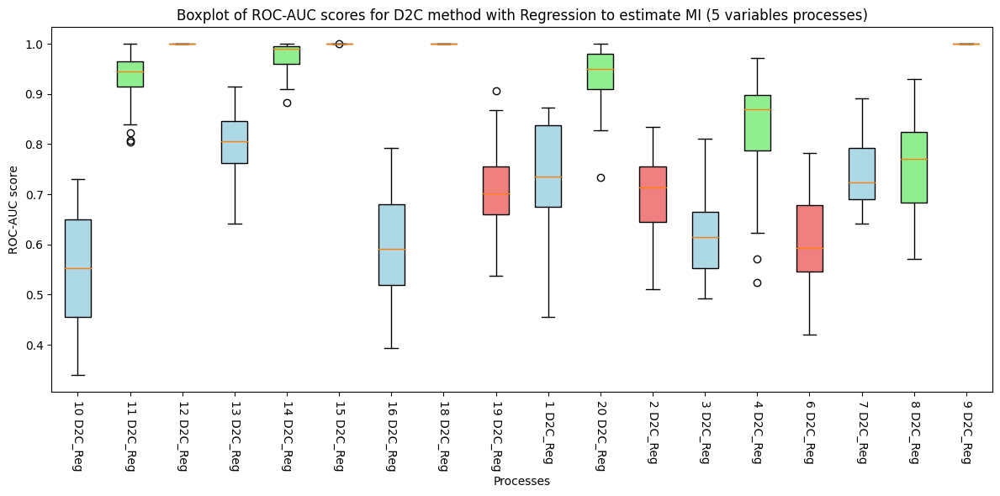

In [3]:
#################################################################### LOAD DATA #####################################################################
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

with open(os.path.join(input_folder, 'journal_results_d2c_R_N5.pkl'), 'rb') as f:
    D2C_rocs_process, D2C_precision_process, D2C_recall_process, D2C_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)


##################################################################### PLOT #########################################################################

df1 = pd.DataFrame(D2C_rocs_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} D2C_Reg')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Boxplot of ROC-AUC scores for D2C method with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

### TD2C (& TD2C but without contrmporaneous nodes)

#### Descriptors Generation

In [5]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C/'  

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='original',
            mb_estimator= 'ts',
            top_vars=3)

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

100%|██████████| 18/18 [01:25<00:00,  4.77s/it]


#### Run Classifier

In [6]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []
descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C/'

# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [7]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file

for n_vars, todo in todos.items():
    td2c_rocs_process = {}
    td2c_precision_process = {}
    td2c_recall_process = {}
    td2c_f1_process = {}
    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        td2c_rocs_process[gen_process_number] = rocs
        td2c_precision_process[gen_process_number] = precisions
        td2c_recall_process[gen_process_number] = recalls
        td2c_f1_process[gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/my

#### Save Results

In [8]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_td2c_R_N5.pkl'), 'wb') as f:
    everything = (td2c_rocs_process, td2c_precision_process, td2c_recall_process, td2c_f1_process)
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_td2c_R_N10.pkl'), 'wb') as f:
#     everything = (td2c_R_rocs_process, td2c_R_precision_process, td2c_R_recall_process, td2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_td2c_R_N25.pkl'), 'wb') as f:
#     everything = (td2c_R_rocs_process, td2c_R_precision_process, td2c_R_recall_process, td2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Plot

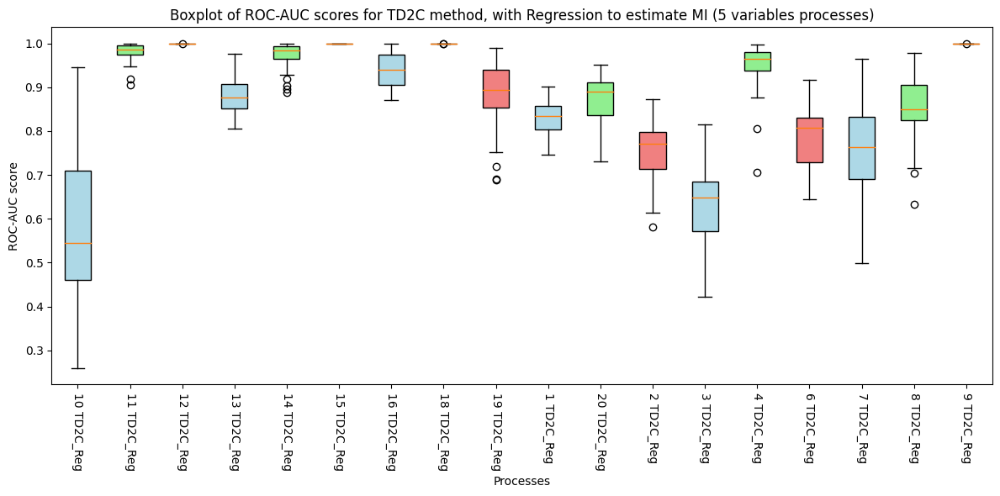

In [4]:
#################################################################### LOAD DATA #####################################################################
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

with open(os.path.join(input_folder, 'journal_results_td2c_R_N5.pkl'), 'rb') as f:
    TD2C_rocs_process, TD2C_precision_process, TD2C_recall_process, TD2C_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)


##################################################################### PLOT #########################################################################

df1 = pd.DataFrame(TD2C_rocs_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} TD2C_Reg')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Boxplot of ROC-AUC scores for TD2C method, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

### TD2C + Ranking (All methods)

#### Descriptors Generation

In [27]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################

# SET FOLDER
cartella = 4
# 1 = TD2C_+Ranking_1
# 2 = TD2C_+Ranking_2
# 3 = TD2C_+Ranking_3, 
# 4 = TD2C_+Ranking_NoCont
# 11 = TD2C_+Ranking_1 with two variables from ranking 
# 111 = TD2C_+Ranking_1 with three variables from ranking
# 110 = TD2C_+Ranking_1 with ten variables from ranking
# 5 = TD2C_+Ranking_4 with one variable from ranking
# 6 = TD2C_+Ranking_5 with one variable from ranking
# 7 = TD2C_+Ranking_6 with one variable from ranking
# 8 = TD2C_+Ranking_7 with one variable from ranking

if cartella == 1:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/1_Var/' 
    ts_rank = 'ts_rank'
    vars_to_keep = 1
elif cartella == 11:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/2_Var/'
    ts_rank = 'ts_rank'
    vars_to_keep = 2
elif cartella == 111:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/3_Var/'
    ts_rank = 'ts_rank'
    vars_to_keep = 3
elif cartella == 110:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/10_Var/'
    ts_rank = 'ts_rank'
    vars_to_keep = 10
elif cartella == 2:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_2/'
    ts_rank = 'ts_rank_2'
    vars_to_keep = 1
elif cartella == 3:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_3/'
    ts_rank = 'ts_rank_3'
    vars_to_keep = 1
elif cartella == 4:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_NoCont/'
    ts_rank = 'ts_rank_no_cont' 
    vars_to_keep = 1
elif cartella == 5:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_4/'
    ts_rank = 'ts_rank_4' 
    vars_to_keep = 1
elif cartella == 6:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_5/'
    ts_rank = 'ts_rank_5' 
    vars_to_keep = 1
elif cartella == 7:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_6/'
    ts_rank = 'ts_rank_6' 
    vars_to_keep = 1
elif cartella == 8:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_7/'
    ts_rank = 'ts_rank_7' 
    vars_to_keep = 1

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='original',
            mb_estimator= ts_rank,
            top_vars = vars_to_keep)

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

  0%|          | 0/18 [00:00<?, ?it/s]

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

  6%|▌         | 1/18 [00:10<03:03, 10.77s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: 

 11%|█         | 2/18 [00:21<02:47, 10.46s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

 17%|█▋        | 3/18 [00:36<03:13, 12.91s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: 

 22%|██▏       | 4/18 [00:50<03:06, 13.31s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y:

 28%|██▊       | 5/18 [01:10<03:25, 15.78s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y:

 33%|███▎      | 6/18 [01:21<02:47, 13.98s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

 39%|███▉      | 7/18 [01:32<02:22, 12.96s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)



Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (

 44%|████▍     | 8/18 [01:43<02:04, 12.49s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (2

 50%|█████     | 9/18 [02:06<02:21, 15.73s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y:

 56%|█████▌    | 10/18 [02:21<02:04, 15.57s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

 61%|██████    | 11/18 [02:32<01:38, 14.10s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: 

 67%|██████▋   | 12/18 [02:49<01:30, 15.05s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)



Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: 

 72%|███████▏  | 13/18 [03:12<01:26, 17.38s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

 78%|███████▊  | 14/18 [03:28<01:07, 16.85s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

 83%|████████▎ | 15/18 [03:43<00:49, 16.34s/it]

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (

 89%|████████▉ | 16/18 [04:00<00:32, 16.50s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)


Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)



Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (

 94%|█████████▍| 17/18 [04:22<00:18, 18.11s/it]

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)Shape of X: (245, 25), Shape of Y: (245,)

Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y: (245,)
Shape of X: (245, 25), Shape of Y:

100%|██████████| 18/18 [04:38<00:00, 15.47s/it]


#### Run Classifier

In [28]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []

# TAKES THE FOLDER SET AT THE STEP BEFORE AND RUN ALL THE FOLLOWING CELLS FOR THIS METHOD
# 1 = TD2C_+Ranking_1
# 2 = TD2C_+Ranking_2
# 3 = TD2C_+Ranking_3
# 4 = TD2C_+Ranking_NoCont
# 11 = TD2C_+Ranking_1 with two variables from ranking 
# 111 = TD2C_+Ranking_1 with three variables from ranking
# 110 = TD2C_+Ranking_1 with ten variables from ranking
# 5 = TD2C_+Ranking_4 with two variables from ranking
# 6 = TD2C_+Ranking_5 with three variables from ranking

if cartella == 1:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/1_Var/' 
    name = 'TD2C_Ranking_1_1_Var'
elif cartella == 11:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/2_Var/'
    name = 'TD2C_Ranking_1_2_Var'
elif cartella == 111:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/3_Var/'
    name = 'TD2C_Ranking_1_3_Var'
elif cartella == 110:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_1/10_Var/'
    name = 'TD2C_Ranking_1_10_Var'
elif cartella == 2:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_2/'
    name = 'TD2C_Ranking_2'
elif cartella == 3:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C_+Ranking_3/'
    name = 'TD2C_Ranking_3'
elif cartella == 4:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_NoCont/'
    name = 'TD2C_Ranking_NoCont'
elif cartella == 5:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_4/'
    name = 'TD2C_Ranking_4'
elif cartella == 6:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_5/'
    name = 'TD2C_Ranking_5'
elif cartella == 7:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_6/'
    name = 'TD2C_Ranking_6'
elif cartella == 8:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_+Ranking/TD2C+Ranking_7/'
    name = 'TD2C_Ranking_7'



# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [29]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file


for n_vars, todo in todos.items():
    m1 = f'{name}_rocs_process'
    m2 = f'{name}_precision_process'
    m3 = f'{name}_recall_process'
    m4 = f'{name}_f1_process'

    globals()[m1] = {}
    globals()[m2] = {}
    globals()[m3] = {}
    globals()[m4] = {}


    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        globals()[m1][gen_process_number] = rocs
        globals()[m2][gen_process_number] = precisions
        globals()[m3][gen_process_number] = recalls
        globals()[m4][gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/my

#### Save Results

In [30]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_{name}_N5.pkl'), 'wb') as f:
    everything = (globals()[m1], globals()[m2], globals()[m3], globals()[m4])
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N10.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N25.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Load data for local and global plots

##### local save

In [31]:
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

# LOCAL
with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
    globals()[m1], globals()[m2], globals()[m3], globals()[m4] = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

##### global save

In [32]:
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

cartella = 4

if cartella == 1:
    name = 'TD2C_Ranking_1_1_Var'
elif cartella == 11:
    name = 'TD2C_Ranking_1_2_Var'
elif cartella == 111:
    name = 'TD2C_Ranking_1_3_Var'
elif cartella == 110:
    name = 'TD2C_Ranking_1_10_Var'
elif cartella == 2:
    name = 'TD2C_Ranking_2'
elif cartella == 3:
    name = 'TD2C_Ranking_3'
elif cartella == 4:
    name = 'TD2C_Ranking_NoCont'
elif cartella == 5:
    name = 'TD2C_Ranking_4'
elif cartella == 6:
    name = 'TD2C_Ranking_5'
elif cartella == 7:
    name = 'TD2C_Ranking_6'
elif cartella == 8:
    name = 'TD2C_Ranking_7'

if cartella == 1:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_1_Var_rocs_process, TD2C_Ranking_1_1_Var_precision_process, TD2C_Ranking_1_1_Var_recall_process, TD2C_Ranking_1_1_Var_f1_process = pickle.load(f)
elif cartella == 11:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_2_Var_rocs_process, TD2C_Ranking_1_2_Var_precision_process, TD2C_Ranking_1_2_Var_recall_process, TD2C_Ranking_1_2_Var_f1_process = pickle.load(f)
elif cartella == 111:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_3_Var_rocs_process, TD2C_Ranking_1_3_Var_precision_process, TD2C_Ranking_1_3_Var_recall_process, TD2C_Ranking_1_3_Var_f1_process = pickle.load(f)
elif cartella == 110:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_10_Var_rocs_process, TD2C_Ranking_1_10_Var_precision_process, TD2C_Ranking_1_10_Var_recall_process, TD2C_Ranking_1_10_Var_f1_process = pickle.load(f)
elif cartella == 2:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_2_rocs_process, TD2C_Ranking_2_precision_process, TD2C_Ranking_2_recall_process, TD2C_Ranking_2_f1_process = pickle.load(f)
elif cartella == 3:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_3_rocs_process, TD2C_Ranking_3_precision_process, TD2C_Ranking_3_recall_process, TD2C_Ranking_3_f1_process = pickle.load(f)
elif cartella == 4:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_NoCont_rocs_process, TD2C_Ranking_NoCont_precision_process, TD2C_Ranking_NoCont_recall_process, TD2C_Ranking_NoCont_f1_process = pickle.load(f)
elif cartella == 5:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_4_rocs_process, TD2C_Ranking_4_precision_process, TD2C_Ranking_4_recall_process, TD2C_Ranking_4_f1_process = pickle.load(f)
elif cartella == 6:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_5_rocs_process, TD2C_Ranking_5_precision_process, TD2C_Ranking_5_recall_process, TD2C_Ranking_5_f1_process = pickle.load(f)
elif cartella == 7:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_6_rocs_process, TD2C_Ranking_6_precision_process, TD2C_Ranking_6_recall_process, TD2C_Ranking_6_f1_process = pickle.load(f)
elif cartella == 8:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_7_rocs_process, TD2C_Ranking_7_precision_process, TD2C_Ranking_7_recall_process, TD2C_Ranking_7_f1_process = pickle.load(f)

#### Plot

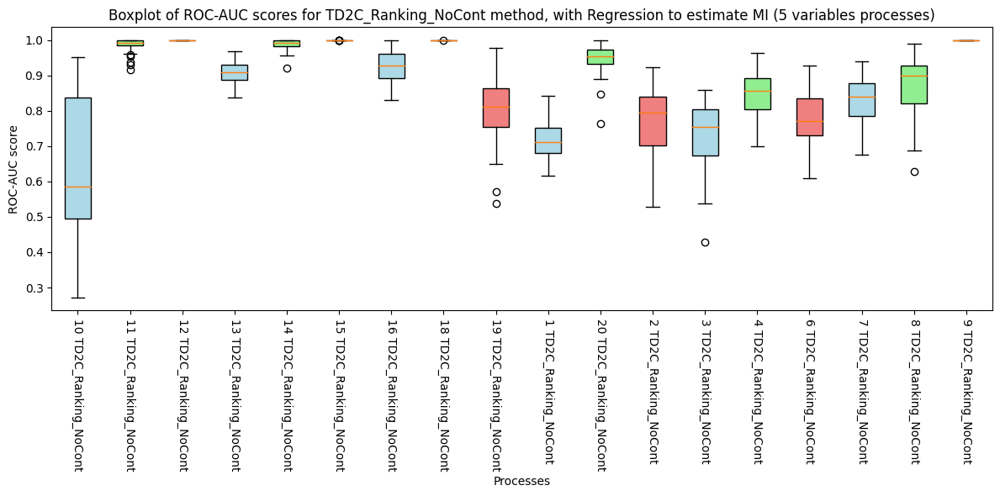

In [33]:
df1 = pd.DataFrame(globals()[m1])
df_name = f'{name}_rocs_dataset'
globals()[df_name] = df1

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} {name}')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title(f'Boxplot of ROC-AUC scores for {name} method, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

### TD2C in the past-future (& TD2C in the past-future but without contrmporaneous nodes)

#### Descriptors Generation

In [19]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_PastFut/'  

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='original',
            mb_estimator= 'ts_past')

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

100%|██████████| 18/18 [04:44<00:00, 15.79s/it]


#### Run Classifier

In [37]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []
descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/Regression/TD2C_PastFut/'

# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [38]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file

for n_vars, todo in todos.items():
    td2c_past_rocs_process = {}
    td2c_past_precision_process = {}
    td2c_past_recall_process = {}
    td2c_past_f1_process = {}
    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        td2c_past_rocs_process[gen_process_number] = rocs
        td2c_past_precision_process[gen_process_number] = precisions
        td2c_past_recall_process[gen_process_number] = recalls
        td2c_past_f1_process[gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/my

#### Save Results

In [39]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_td2c_past_R_N5.pkl'), 'wb') as f:
    everything = (td2c_past_rocs_process, td2c_past_precision_process, td2c_past_recall_process, td2c_past_f1_process)
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N10.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N25.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Plot

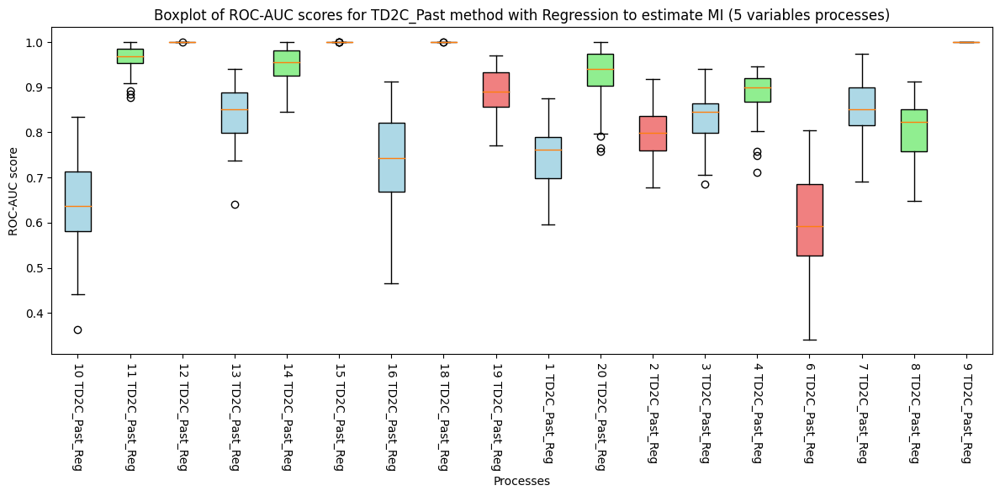

In [15]:
#################################################################### LOAD DATA #####################################################################
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/journals/'

with open(os.path.join(input_folder, 'journal_results_td2c_past_R_N5.pkl'), 'rb') as f:
    TD2C_Ranking_PastFut_rocs_process, TD2C_Ranking_PastFut_precision_process, TD2C_Ranking_PastFut_recall_process, TD2C_Ranking_PastFut_f1_process = pickle.load(f) 

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)


##################################################################### PLOT #########################################################################

df1 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} TD2C_Past_Reg')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Boxplot of ROC-AUC scores for TD2C_Past method with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

## KNNCMI Estimation of MI

### D2C (& D2C but without contemporaneous nodes) 

#### Descriptors Generation

In [4]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/D2C/'  

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='cmiknn_3',
            mb_estimator= 'original',
            top_vars=3)

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

  0%|          | 0/18 [00:00<?, ?it/s]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

  6%|▌         | 1/18 [00:49<13:57, 49.24s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 11%|█         | 2/18 [01:36<12:53, 48.32s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y

 17%|█▋        | 3/18 [02:49<14:48, 59.24s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y:

 22%|██▏       | 4/18 [03:50<13:58, 59.91s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 28%|██▊       | 5/18 [04:34<11:45, 54.27s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 33%|███▎      | 6/18 [05:17<10:07, 50.59s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y:

 39%|███▉      | 7/18 [06:00<08:48, 48.00s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 44%|████▍     | 8/18 [06:48<08:01, 48.14s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 50%|█████     | 9/18 [07:51<07:55, 52.79s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 56%|█████▌    | 10/18 [08:54<07:26, 55.75s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 61%|██████    | 11/18 [09:38<06:04, 52.08s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y:

 67%|██████▋   | 12/18 [10:39<05:29, 54.86s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 72%|███████▏  | 13/18 [11:43<04:48, 57.70s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 78%|███████▊  | 14/18 [12:47<03:58, 59.56s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 83%|████████▎ | 15/18 [13:50<03:01, 60.51s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)


Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 89%|████████▉ | 16/18 [14:51<02:01, 60.64s/it]

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

 94%|█████████▍| 17/18 [15:52<01:01, 61.01s/it]

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)Shape of X: (245, 29), Shape of Y: (245,)

Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y: (245,)
Shape of X: (245, 29), Shape of Y:

100%|██████████| 18/18 [16:52<00:00, 56.24s/it]


#### Run Classifier

In [5]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []
descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/D2C/'

# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [6]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file

for n_vars, todo in todos.items():
    d2c_rocs_process = {}
    d2c_precision_process = {}
    d2c_recall_process = {}
    d2c_f1_process = {}
    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        d2c_rocs_process[gen_process_number] = rocs
        d2c_precision_process[gen_process_number] = precisions
        d2c_recall_process[gen_process_number] = recalls
        d2c_f1_process[gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]

 78%|███████▊  | 14/18 [01:37<00:27,  6.83s/it]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarin

#### Save Results

In [7]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_d2c_R_N5.pkl'), 'wb') as f:
    everything = (d2c_rocs_process, d2c_precision_process, d2c_recall_process, d2c_f1_process)
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N10.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N25.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Plot

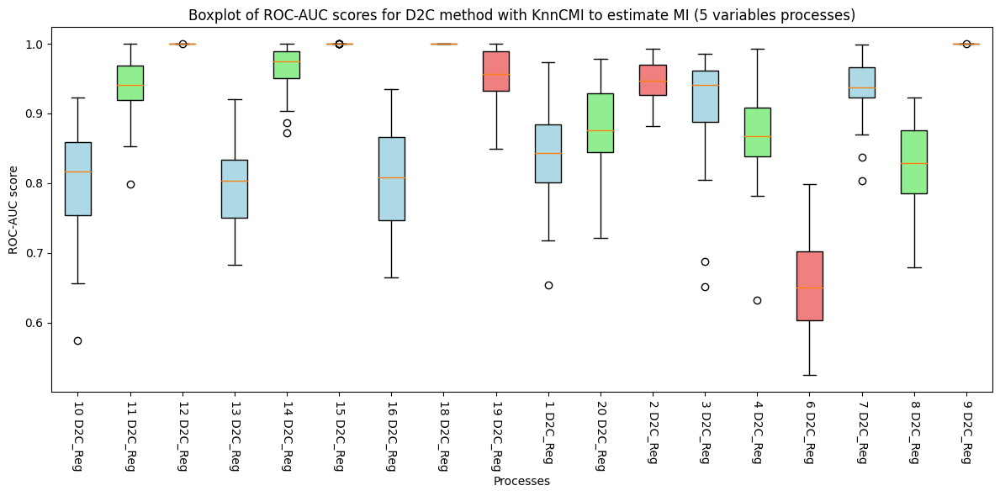

In [8]:
#################################################################### LOAD DATA #####################################################################
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

with open(os.path.join(input_folder, 'journal_results_d2c_R_N5.pkl'), 'rb') as f:
    D2C_rocs_process, D2C_precision_process, D2C_recall_process, D2C_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)


##################################################################### PLOT #########################################################################

df1 = pd.DataFrame(D2C_rocs_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} D2C_Reg')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Boxplot of ROC-AUC scores for D2C method with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

### TD2C (& TD2C but without contrmporaneous nodes)

#### Descriptors Generation

In [4]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C/'  

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='cmiknn_3',
            mb_estimator= 'ts',
            top_vars=3)

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

  0%|          | 0/18 [00:00<?, ?it/s]

100%|██████████| 18/18 [20:49<00:00, 69.41s/it]


#### Run Classifier

In [5]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []
descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C/'

# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [6]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file

for n_vars, todo in todos.items():
    td2c_rocs_process = {}
    td2c_precision_process = {}
    td2c_recall_process = {}
    td2c_f1_process = {}
    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        td2c_rocs_process[gen_process_number] = rocs
        td2c_precision_process[gen_process_number] = precisions
        td2c_recall_process[gen_process_number] = recalls
        td2c_f1_process[gen_process_number] = f1s

 67%|██████▋   | 12/18 [01:27<00:41,  7.00s/it]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
100%|██████████| 18/18 [02:09<00:00,  7.18s/it]


#### Save Results

In [7]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_td2c_R_N5.pkl'), 'wb') as f:
    everything = (td2c_rocs_process, td2c_precision_process, td2c_recall_process, td2c_f1_process)
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_td2c_R_N10.pkl'), 'wb') as f:
#     everything = (td2c_R_rocs_process, td2c_R_precision_process, td2c_R_recall_process, td2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_td2c_R_N25.pkl'), 'wb') as f:
#     everything = (td2c_R_rocs_process, td2c_R_precision_process, td2c_R_recall_process, td2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Plot

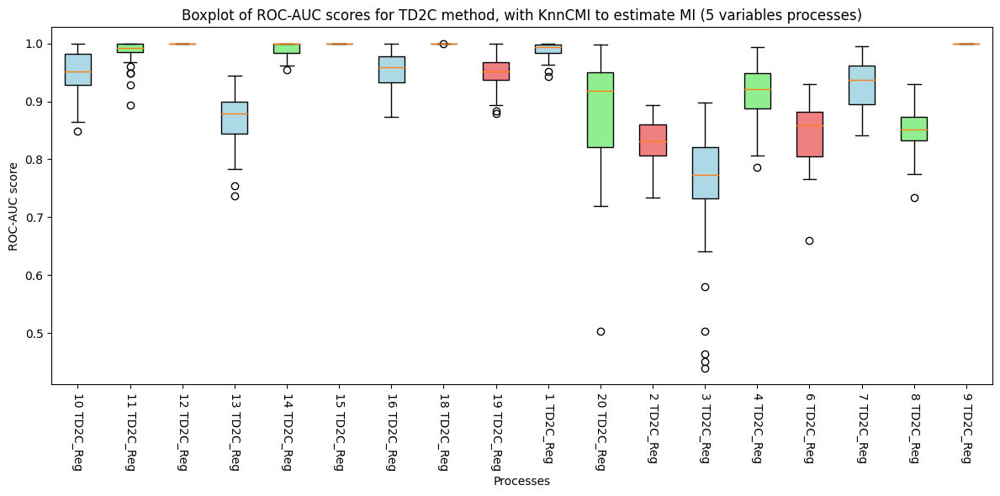

In [8]:
#################################################################### LOAD DATA #####################################################################
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

with open(os.path.join(input_folder, 'journal_results_td2c_R_N5.pkl'), 'rb') as f:
    TD2C_rocs_process, TD2C_precision_process, TD2C_recall_process, TD2C_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)


##################################################################### PLOT #########################################################################

df1 = pd.DataFrame(TD2C_rocs_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} TD2C_Reg')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Boxplot of ROC-AUC scores for TD2C method, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

### TD2C + Ranking (All methods)

#### Descriptors Generation

In [ ]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################

# SET FOLDER
cartella = 8
# 1 = TD2C_+Ranking_1
# 2 = TD2C_+Ranking_2
# 3 = TD2C_+Ranking_3, 
# 4 = TD2C_+Ranking_NoCont
# 11 = TD2C_+Ranking_1 with two variables from ranking 
# 111 = TD2C_+Ranking_1 with three variables from ranking
# 110 = TD2C_+Ranking_1 with ten variables from ranking
# 5 = TD2C_+Ranking_4 with one variable from ranking
# 6 = TD2C_+Ranking_5 with one variable from ranking
# 7 = TD2C_+Ranking_6 with one variable from ranking
# 8 = TD2C_+Ranking_7 with one variable from ranking

if cartella == 1:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/1_Var/' 
    ts_rank = 'ts_rank'
    vars_to_keep = 1
elif cartella == 11:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/2_Var/'
    ts_rank = 'ts_rank'
    vars_to_keep = 2
elif cartella == 111:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/3_Var/'
    ts_rank = 'ts_rank'
    vars_to_keep = 3
elif cartella == 110:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/10_Var/'
    ts_rank = 'ts_rank'
    vars_to_keep = 10
elif cartella == 2:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_2/'
    ts_rank = 'ts_rank_2'
    vars_to_keep = 1
elif cartella == 3:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_3/'
    ts_rank = 'ts_rank_3'
    vars_to_keep = 1
elif cartella == 4:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_NoCont/'
    ts_rank = 'ts_rank_no_cont' 
    vars_to_keep = 1
elif cartella == 5:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_4/'
    ts_rank = 'ts_rank_4' 
    vars_to_keep = 1
elif cartella == 6:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_5/'
    ts_rank = 'ts_rank_5' 
    vars_to_keep = 1
elif cartella == 7:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_6/'
    ts_rank = 'ts_rank_6' 
    vars_to_keep = 1
elif cartella == 8:
    output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_7/'
    ts_rank = 'ts_rank_7' 
    vars_to_keep = 1

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='cmiknn_3',
            mb_estimator= ts_rank,
            top_vars = vars_to_keep)

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

  0%|          | 0/18 [00:00<?, ?it/s]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

  6%|▌         | 1/18 [00:27<07:43, 27.24s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y:

 11%|█         | 2/18 [00:52<06:57, 26.07s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)




Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y:

 17%|█▋        | 3/18 [01:25<07:15, 29.01s/it]

Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 22%|██▏       | 4/18 [01:57<07:07, 30.53s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y:

 28%|██▊       | 5/18 [02:24<06:20, 29.31s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)


Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y:

 33%|███▎      | 6/18 [02:48<05:29, 27.46s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y:

 39%|███▉      | 7/18 [03:12<04:48, 26.24s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 44%|████▍     | 8/18 [03:36<04:15, 25.55s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y:

 50%|█████     | 9/18 [04:02<03:50, 25.64s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 56%|█████▌    | 10/18 [04:37<03:47, 28.50s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)


Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y:

 61%|██████    | 11/18 [05:01<03:10, 27.27s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 67%|██████▋   | 12/18 [05:40<03:03, 30.62s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)



Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 72%|███████▏  | 13/18 [06:12<02:35, 31.09s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 78%|███████▊  | 14/18 [06:44<02:05, 31.36s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y:

 83%|████████▎ | 15/18 [07:19<01:37, 32.58s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)



Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)


Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)



Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y:

 89%|████████▉ | 16/18 [07:51<01:04, 32.29s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y:

 94%|█████████▍| 17/18 [08:23<00:32, 32.28s/it]

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)Shape of X: (245, 27), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)
Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y: (245,)Shape of X: (245, 28), Shape of Y: (245,)

Shape of X: (245, 27), Shape of Y: (245,)
Shape of X: (245, 28), Shape of Y:

100%|██████████| 18/18 [08:56<00:00, 29.83s/it]


#### Run Classifier

In [ ]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []

# TAKES THE FOLDER SET AT THE STEP BEFORE AND RUN ALL THE FOLLOWING CELLS FOR THIS METHOD
# 1 = TD2C_+Ranking_1
# 2 = TD2C_+Ranking_2
# 3 = TD2C_+Ranking_3
# 4 = TD2C_+Ranking_NoCont
# 11 = TD2C_+Ranking_1 with two variables from ranking 
# 111 = TD2C_+Ranking_1 with three variables from ranking
# 110 = TD2C_+Ranking_1 with ten variables from ranking
# 5 = TD2C_+Ranking_4 with two variables from ranking
# 6 = TD2C_+Ranking_5 with three variables from ranking

if cartella == 1:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/1_Var/' 
    name = 'TD2C_Ranking_1_1_Var'
elif cartella == 11:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/2_Var/'
    name = 'TD2C_Ranking_1_2_Var'
elif cartella == 111:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/3_Var/'
    name = 'TD2C_Ranking_1_3_Var'
elif cartella == 110:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_1/10_Var/'
    name = 'TD2C_Ranking_1_10_Var'
elif cartella == 2:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_2/'
    name = 'TD2C_Ranking_2'
elif cartella == 3:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C_+Ranking_3/'
    name = 'TD2C_Ranking_3'
elif cartella == 4:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_NoCont/'
    name = 'TD2C_Ranking_NoCont'
elif cartella == 5:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_4/'
    name = 'TD2C_Ranking_4'
elif cartella == 6:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_5/'
    name = 'TD2C_Ranking_5'
elif cartella == 7:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_6/'
    name = 'TD2C_Ranking_6'
elif cartella == 8:
    descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_+Ranking/TD2C+Ranking_7/'
    name = 'TD2C_Ranking_7'



# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [ ]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file


for n_vars, todo in todos.items():
    m1 = f'{name}_rocs_process'
    m2 = f'{name}_precision_process'
    m3 = f'{name}_recall_process'
    m4 = f'{name}_f1_process'

    globals()[m1] = {}
    globals()[m2] = {}
    globals()[m3] = {}
    globals()[m4] = {}


    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        globals()[m1][gen_process_number] = rocs
        globals()[m2][gen_process_number] = precisions
        globals()[m3][gen_process_number] = recalls
        globals()[m4][gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/my

#### Save Results

In [ ]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_{name}_N5.pkl'), 'wb') as f:
    everything = (globals()[m1], globals()[m2], globals()[m3], globals()[m4])
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N10.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N25.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Load data for local and global plots

##### local save

In [ ]:
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

# LOCAL
with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
    globals()[m1], globals()[m2], globals()[m3], globals()[m4] = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

##### global save

In [ ]:
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

cartella = 8

if cartella == 1:
    name = 'TD2C_Ranking_1_1_Var'
elif cartella == 11:
    name = 'TD2C_Ranking_1_2_Var'
elif cartella == 111:
    name = 'TD2C_Ranking_1_3_Var'
elif cartella == 110:
    name = 'TD2C_Ranking_1_10_Var'
elif cartella == 2:
    name = 'TD2C_Ranking_2'
elif cartella == 3:
    name = 'TD2C_Ranking_3'
elif cartella == 4:
    name = 'TD2C_Ranking_NoCont'
elif cartella == 5:
    name = 'TD2C_Ranking_4'
elif cartella == 6:
    name = 'TD2C_Ranking_5'
elif cartella == 7:
    name = 'TD2C_Ranking_6'
elif cartella == 8:
    name = 'TD2C_Ranking_7'

if cartella == 1:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_1_Var_rocs_process, TD2C_Ranking_1_1_Var_precision_process, TD2C_Ranking_1_1_Var_recall_process, TD2C_Ranking_1_1_Var_f1_process = pickle.load(f)
elif cartella == 11:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_2_Var_rocs_process, TD2C_Ranking_1_2_Var_precision_process, TD2C_Ranking_1_2_Var_recall_process, TD2C_Ranking_1_2_Var_f1_process = pickle.load(f)
elif cartella == 111:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_3_Var_rocs_process, TD2C_Ranking_1_3_Var_precision_process, TD2C_Ranking_1_3_Var_recall_process, TD2C_Ranking_1_3_Var_f1_process = pickle.load(f)
elif cartella == 110:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_1_10_Var_rocs_process, TD2C_Ranking_1_10_Var_precision_process, TD2C_Ranking_1_10_Var_recall_process, TD2C_Ranking_1_10_Var_f1_process = pickle.load(f)
elif cartella == 2:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_2_rocs_process, TD2C_Ranking_2_precision_process, TD2C_Ranking_2_recall_process, TD2C_Ranking_2_f1_process = pickle.load(f)
elif cartella == 3:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_3_rocs_process, TD2C_Ranking_3_precision_process, TD2C_Ranking_3_recall_process, TD2C_Ranking_3_f1_process = pickle.load(f)
elif cartella == 4:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_NoCont_rocs_process, TD2C_Ranking_NoCont_precision_process, TD2C_Ranking_NoCont_recall_process, TD2C_Ranking_NoCont_f1_process = pickle.load(f)
elif cartella == 5:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_4_rocs_process, TD2C_Ranking_4_precision_process, TD2C_Ranking_4_recall_process, TD2C_Ranking_4_f1_process = pickle.load(f)
elif cartella == 6:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_5_rocs_process, TD2C_Ranking_5_precision_process, TD2C_Ranking_5_recall_process, TD2C_Ranking_5_f1_process = pickle.load(f)
elif cartella == 7:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_6_rocs_process, TD2C_Ranking_6_precision_process, TD2C_Ranking_6_recall_process, TD2C_Ranking_6_f1_process = pickle.load(f)
elif cartella == 8:
    with open(os.path.join(input_folder, f'journal_results_{name}_N5.pkl'), 'rb') as f:
        TD2C_Ranking_7_rocs_process, TD2C_Ranking_7_precision_process, TD2C_Ranking_7_recall_process, TD2C_Ranking_7_f1_process = pickle.load(f)

#### Plot

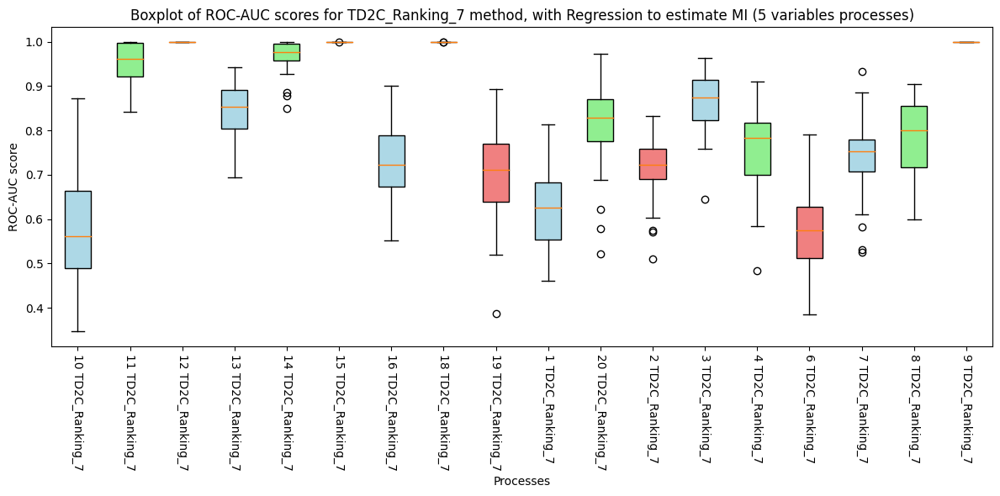

In [ ]:
df1 = pd.DataFrame(globals()[m1])
df_name = f'{name}_rocs_dataset'
globals()[df_name] = df1

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} {name}')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title(f'Boxplot of ROC-AUC scores for {name} method, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

### TD2C in the past-future (& TD2C in the past-future but without contrmporaneous nodes)

#### Descriptors Generation

In [ ]:
######################################################### SETTING FOR DESCRIPTORS COMPUTATION ######################################################

input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_process = [] # list of files to process

# This loop is used to filter the files to process and obtain the parameters of the process
# The resulting list will be used to parallelize the process and will be passed to the DataLoader.
# The result is of the form (file, gen_process_number, n_variables, max_neighborhood_size, noise_std)
# asnd is saved in the to_process list.
for file in sorted(os.listdir(input_folder)): 
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

    if noise_std != 0.01:
        continue
    
    if max_neighborhood_size != 2:
        continue

    # if n_variables != 5:
    #     continue

    to_process.append(file)


############################################################### COMPUTE DESCRIPTORS ################################################################
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_PastFut/'  

# create output folder if it does not exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# This loop processes the files in the input folder (to_process) and saves the descriptors in the output folder.

# At first, we collect the parameters of the process from the file name.
for file in tqdm(to_process):
    gen_process_number = int(file.split('_')[0][1:])
    n_variables = int(file.split('_')[1][1:])
    max_neighborhood_size = int(file.split('_')[2][2:])
    noise_std = float(file.split('_')[3][1:-4])

# The DataLoader is initialized with the parameters of the process. 
    dataloader = DataLoader(n_variables = n_variables,
                    maxlags = maxlags)
    dataloader.from_pickle(input_folder+file)

# The D2C object is initialized with the DataLoader and the parameters of the process.
    d2c = D2C(observations=dataloader.get_observations(), 
            dags=dataloader.get_dags(), 
            couples_to_consider_per_dag=COUPLES_TO_CONSIDER_PER_DAG, 
            MB_size=MB_SIZE, 
            n_variables=n_variables, 
            maxlags=maxlags,
            seed=SEED,
            n_jobs=N_JOBS,
            full=True,
            quantiles=True,
            normalize=True,
            cmi='cmiknn_3',
            mb_estimator= 'ts_past')

    d2c.initialize() # initializes the D2C object

    descriptors_df = d2c.get_descriptors_df()  # computes the descriptors

    descriptors_df.insert(0, 'process_id', gen_process_number)
    descriptors_df.insert(2, 'n_variables', n_variables)
    descriptors_df.insert(3, 'max_neighborhood_size', max_neighborhood_size)
    descriptors_df.insert(4, 'noise_std', noise_std)

    # The descriptors are saved in the output folder as a pickle file.
    descriptors_df.to_pickle(output_folder+f'P{gen_process_number}_N{n_variables}_Nj{max_neighborhood_size}_n{noise_std}_MB{MB_SIZE}.pkl')

100%|██████████| 18/18 [04:44<00:00, 15.79s/it]


#### Run Classifier

In [ ]:
data_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/data/to_use/'

to_dos = []

# This loop gets a list of all the files to be processed
for testing_file in sorted(os.listdir(data_root)):
    if testing_file.endswith('.pkl'):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])
          
        if noise_std != 0.01: # if the noise is different we skip the file
            continue

        if max_neighborhood_size != 2: # if the max_neighborhood_size is different we skip the file
            continue

        to_dos.append(testing_file) # we add the file to the list (to_dos) to be processed

# sort to_dos by number of variables
to_dos_5_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 5]
# to_dos_10_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 10]
# to_dos_25_variables = [file for file in to_dos if int(file.split('_')[1][1:]) == 25]

# we create a dictionary with the lists of files to be processed
todos = {'5': to_dos_5_variables} # , '10': to_dos_10_variables, '25': to_dos_25_variables

# we create a dictionary to store the results
dfs = []
descriptors_root = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/descriptors/KnnCMI/TD2C_PastFut/'

# Re-save pickle files with protocol 4
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        file_path = os.path.join(descriptors_root, testing_file)
        with open(file_path, 'rb') as f:
            data = pickle.load(f)
        
        # Re-save with protocol 4
        with open(file_path, 'wb') as f:
            pickle.dump(data, f, protocol=4)

# This loop gets the descriptors for the files to be processed
for testing_file in sorted(os.listdir(descriptors_root)):
    if testing_file.endswith('.pkl'):
        df = pd.read_pickle(os.path.join(descriptors_root, testing_file))
        if isinstance(df, pd.DataFrame):
            dfs.append(df)

# we concatenate the descriptors
descriptors_training = pd.concat(dfs, axis=0).reset_index(drop=True)

#### Evaluation Metrics

In [ ]:
# This loop does the following:
# 1. Creates some dictionaries to store the results
# 2. Loads the training data
# 3. Trains the model
# 4. Evaluates the model
# 5. Stores the results in the dictionaries
# 6. Saves the dictionaries in a pickle file

for n_vars, todo in todos.items():
    td2c_past_rocs_process = {}
    td2c_past_precision_process = {}
    td2c_past_recall_process = {}
    td2c_past_f1_process = {}
    for testing_file in tqdm(todo):
        gen_process_number = int(testing_file.split('_')[0][1:])
        n_variables = int(testing_file.split('_')[1][1:])
        max_neighborhood_size = int(testing_file.split('_')[2][2:])
        noise_std = float(testing_file.split('_')[3][1:-4])

        # split training and testing data
        training_data = descriptors_training.loc[descriptors_training['process_id'] != gen_process_number]
        X_train = training_data.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
        y_train = training_data['is_causal']

        testing_data = descriptors_training.loc[(descriptors_training['process_id'] == gen_process_number) & (descriptors_training['n_variables'] == n_variables) & (descriptors_training['max_neighborhood_size'] == max_neighborhood_size) & (descriptors_training['noise_std'] == noise_std)]

        model = BalancedRandomForestClassifier(n_estimators=100, random_state=0, n_jobs=50, max_depth=None, sampling_strategy='auto', replacement=True, bootstrap=False)
        # model = RandomForestClassifier(n_estimators=50, random_state=0, n_jobs=50, max_depth=10)

        model.fit(X_train, y_train)

        rocs = {}
        precisions = {}
        recalls = {}
        f1s = {}
        for graph_id in range(40):
            #load testing descriptors
            test_df = testing_data.loc[testing_data['graph_id'] == graph_id]
            test_df = test_df.sort_values(by=['edge_source','edge_dest']).reset_index(drop=True) # sort for coherence

            X_test = test_df.drop(columns=['process_id', 'graph_id', 'n_variables', 'max_neighborhood_size','noise_std', 'edge_source', 'edge_dest', 'is_causal',])
            y_test = test_df['is_causal']

            y_pred_proba = model.predict_proba(X_test)[:,1]
            y_pred = model.predict(X_test)

            roc = roc_auc_score(y_test, y_pred_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            
            rocs[graph_id] = roc
            precisions[graph_id] = precision
            recalls[graph_id] = recall
            f1s[graph_id] = f1

        td2c_past_rocs_process[gen_process_number] = rocs
        td2c_past_precision_process[gen_process_number] = precisions
        td2c_past_recall_process[gen_process_number] = recalls
        td2c_past_f1_process[gen_process_number] = f1s

  0%|          | 0/18 [00:00<?, ?it/s]/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/myenv3.8/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jpalombarini/td2c/my

#### Save Results

In [ ]:
# pickle everything
output_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

with open(os.path.join(output_folder, f'journal_results_td2c_past_R_N5.pkl'), 'wb') as f:
    everything = (td2c_past_rocs_process, td2c_past_precision_process, td2c_past_recall_process, td2c_past_f1_process)
    pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N10.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)

# with open(os.path.join(output_folder, f'journal_results_d2c_R_N25.pkl'), 'wb') as f:
#     everything = (d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process)
#     pickle.dump(everything, f)  

#### Plot

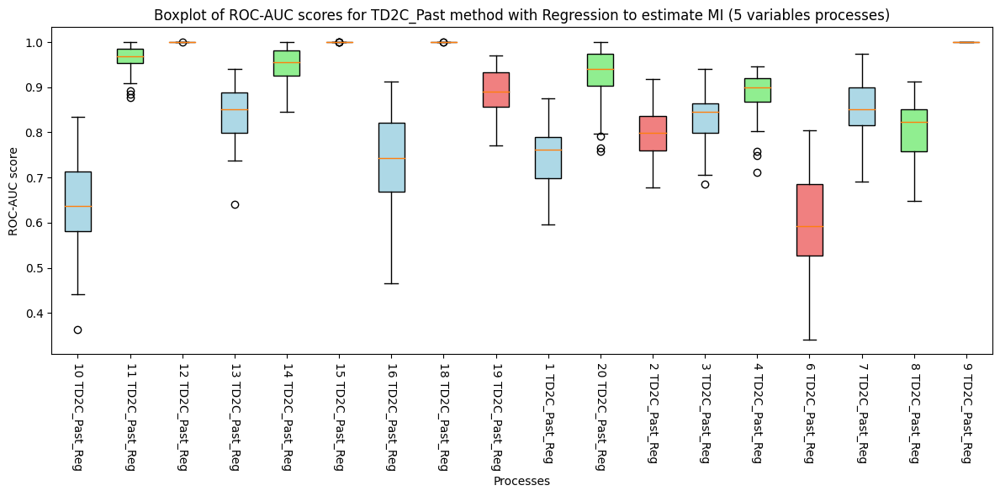

In [ ]:
#################################################################### LOAD DATA #####################################################################
input_folder = '/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/journals/'

with open(os.path.join(input_folder, 'journal_results_td2c_past_R_N5.pkl'), 'rb') as f:
    TD2C_Ranking_PastFut_rocs_process, TD2C_Ranking_PastFut_precision_process, TD2C_Ranking_PastFut_recall_process, TD2C_Ranking_PastFut_f1_process = pickle.load(f) 

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N10.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)

# with open(os.path.join(input_folder, 'journal_results_d2c_R_N25.pkl'), 'rb') as f:
#     d2c_R_rocs_process, d2c_R_precision_process, d2c_R_recall_process, d2c_R_f1_process = pickle.load(f)


##################################################################### PLOT #########################################################################

df1 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col} TD2C_Past_Reg')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Boxplot of ROC-AUC scores for TD2C_Past method with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('ROC-AUC score')
plt.tight_layout()
plt.show()

# Plot all Results - Comparison

## Regression for MI estimation

### ROC-AUC

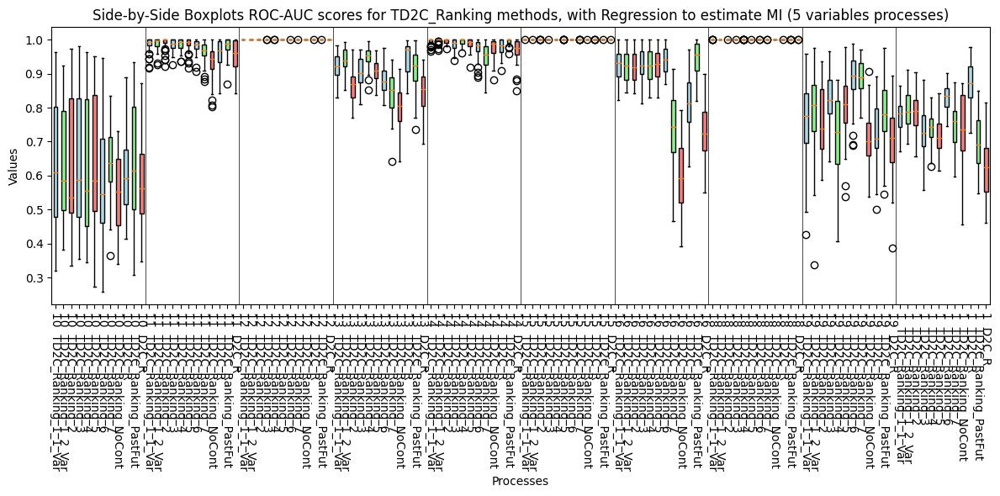

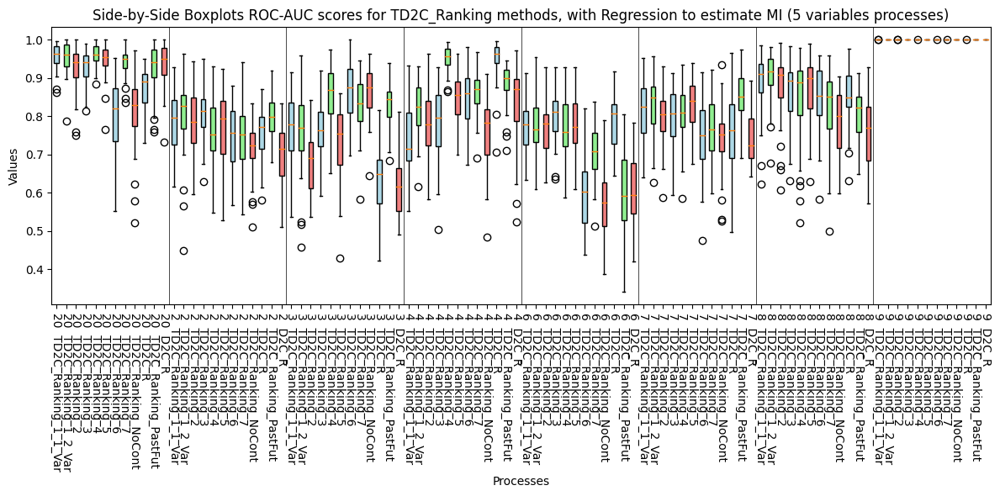

In [57]:
import pandas as pd
import matplotlib.pyplot as plt

# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_rocs_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_rocs_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_rocs_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_rocs_process)
df5 = pd.DataFrame(TD2C_Ranking_2_rocs_process)
df6 = pd.DataFrame(TD2C_Ranking_3_rocs_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_rocs_process)
df8 = pd.DataFrame(TD2C_rocs_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)
df10 = pd.DataFrame(D2C_rocs_process)
df11 = pd.DataFrame(TD2C_Ranking_4_rocs_process)
df12 = pd.DataFrame(TD2C_Ranking_5_rocs_process)
df13 = pd.DataFrame(TD2C_Ranking_6_rocs_process)
df14 = pd.DataFrame(TD2C_Ranking_7_rocs_process)

# Processes 1-9

# Combine data for boxplot
combined_data = []

# Use the first 9 columns (processes)
for col in df5.columns[:10]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df11[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[:10]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting Boxplot
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots ROC-AUC scores for TD2C_Ranking methods, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# Add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i + 0.5, color='black', linewidth=0.5)

# Save the plot as a pdf in folder (optional)
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_1:9.pdf')

plt.show()

# Processes 10-20

combined_data = []

# Use the next 9 columns (processes)
for col in df5.columns[10:18]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df11[col])
    combined_data.append(df7[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])

# Create labels for x-axis
labels = []
for col in df1.columns[10:18]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting Boxplot
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots ROC-AUC scores for TD2C_Ranking methods, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# Add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i + 0.5, color='black', linewidth=0.5)

# Save the plot as a pdf in folder (optional)
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_10:18.pdf')

plt.show()

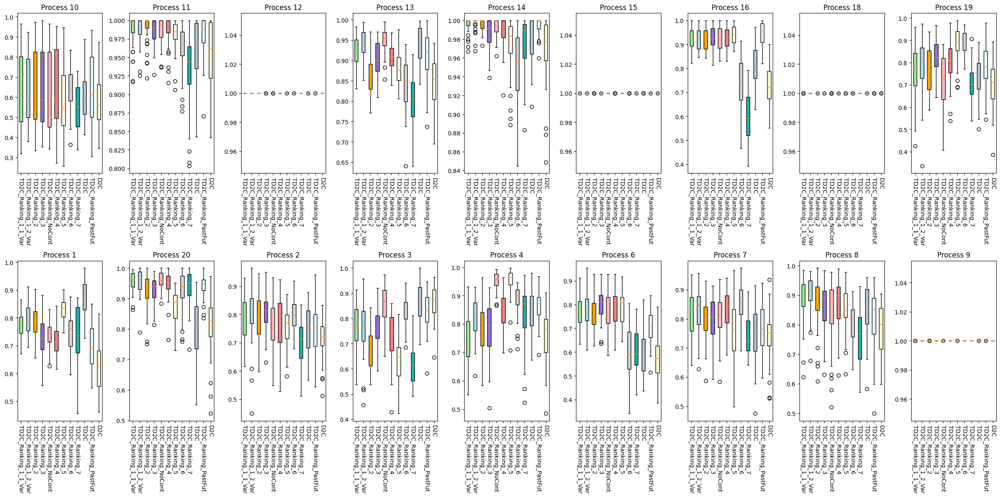

In [58]:
# ANOTHER VISUALIZATION OF THE SAME PLOT

# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_rocs_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_rocs_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_rocs_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_rocs_process)
df5 = pd.DataFrame(TD2C_Ranking_2_rocs_process)
df6 = pd.DataFrame(TD2C_Ranking_3_rocs_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_rocs_process)
df8 = pd.DataFrame(TD2C_rocs_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)
df10 = pd.DataFrame(D2C_rocs_process)
df11 = pd.DataFrame(TD2C_Ranking_4_rocs_process)
df12 = pd.DataFrame(TD2C_Ranking_5_rocs_process)
df13 = pd.DataFrame(TD2C_Ranking_6_rocs_process)
df14 = pd.DataFrame(TD2C_Ranking_7_rocs_process)

# Colors to match the provided image more closely
colors = ['lightgreen', 'lightblue', 'orange', 'mediumpurple', 'lightpink', 'lightcoral', 'lightyellow', 'lightgrey', 'lightseagreen', 'lightsteelblue', 'lightcyan', 'lightgoldenrodyellow', 'lightpink', 'lightsalmon']

# Determine the number of processes (columns)
num_columns = len(df5.columns)

# Calculate the number of rows and columns for subplots
num_rows = 2  # 3 rows
num_cols = 9  # 6 plots per row

# Plotting Boxplot for Processes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, 12))  # Adjust figsize as needed
axes = axes.flatten()

# Iterate over the columns in sequential order
for i, col in enumerate(df5.columns):
    data = [
        df1[col],
        df2[col],
        # df3[col],
        # df4[col],
        df5[col],
        df6[col],
        df11[col],
        df7[col],
        df8[col],
        df9[col],
        df10[col],
        df12[col],
        df13[col],
        df14[col]

    ]
    
    box = axes[i].boxplot(data, patch_artist=True)
    
    # Set colors for each box
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)
    
    axes[i].set_title(f'Process {col}')
    axes[i].set_xticklabels([
        'TD2C_Ranking_1_1_Var',
        'TD2C_Ranking_1_2_Var',
        # 'TD2C_Ranking_1_3_Var',
        # 'TD2C_Ranking_1_10_Var',
        'TD2C_Ranking_2',
        'TD2C_Ranking_3',
        'TD2C_Ranking_NoCont',
        'TD2C_Ranking_4',
        'TD2C_Ranking_5',
        'TD2C_Ranking_6',
        'TD2C_Ranking_7',
        'TD2C',
        'TD2C_Ranking_PastFut',
        'D2C'
    ], rotation=-90)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_best_vs_TD2C.pdf')
plt.show()



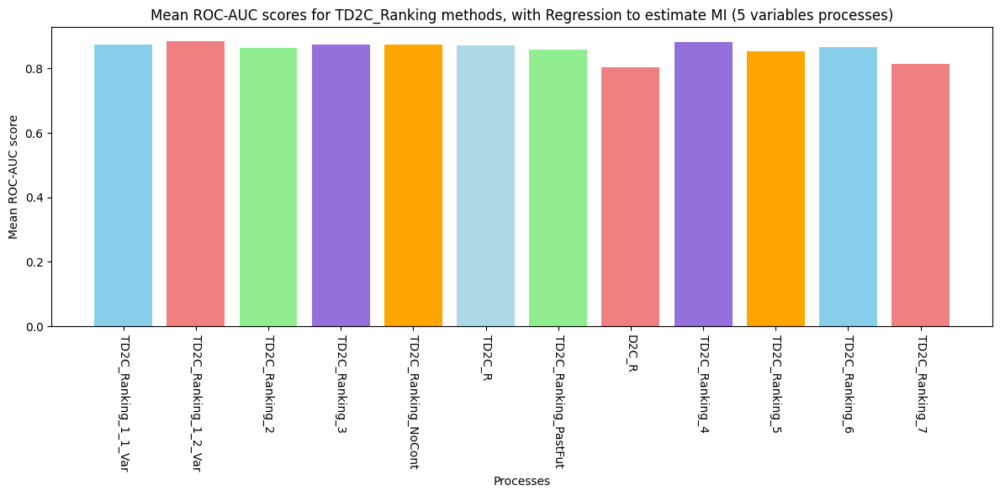

In [60]:
# Calculate the means
means = [
    df1.mean().mean(),
    df2.mean().mean(),
    df5.mean().mean(),
    df6.mean().mean(),
    df7.mean().mean(),
    df8.mean().mean(),
    df9.mean().mean(),
    df10.mean().mean(),
    df11.mean().mean(),
    df12.mean().mean(),
    df13.mean().mean(),
    df14.mean().mean()
]

# Define the labels
labels = [
    'TD2C_Ranking_1_1_Var',
    'TD2C_Ranking_1_2_Var',
    'TD2C_Ranking_2',
    'TD2C_Ranking_3',
    'TD2C_Ranking_NoCont',
    'TD2C_R',
    'TD2C_Ranking_PastFut',
    'D2C_R',
    'TD2C_Ranking_4',
    'TD2C_Ranking_5',
    'TD2C_Ranking_6',
    'TD2C_Ranking_7'
]

# Define the colors
colors = ['skyblue', 'lightcoral', 'lightgreen', 'mediumpurple', 'orange', 'lightblue', 'lightgreen', 'lightcoral', 'mediumpurple', 'orange', 'skyblue', 'lightcoral']

# Barplot the mean of the ROC-AUC scores
plt.figure(figsize=(12, 6))
plt.bar(labels, means, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean ROC-AUC scores for TD2C_Ranking methods, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('Mean ROC-AUC score')
plt.tight_layout()
plt.show()


In [61]:
# NOW SHOW THE ROUC-AUC RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_rocs_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_rocs_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_rocs_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_rocs_process)
df5 = pd.DataFrame(TD2C_Ranking_2_rocs_process)
df6 = pd.DataFrame(TD2C_Ranking_3_rocs_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_rocs_process)
df8 = pd.DataFrame(TD2C_rocs_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)
df10 = pd.DataFrame(D2C_rocs_process)
df11 = pd.DataFrame(TD2C_Ranking_4_rocs_process)
df12 = pd.DataFrame(TD2C_Ranking_5_rocs_process)
df13 = pd.DataFrame(TD2C_Ranking_6_rocs_process)
df14 = pd.DataFrame(TD2C_Ranking_7_rocs_process)

df1 = df1.T
df2 = df2.T
# df3 = df3.T
# df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T
df11 = df11.T
df12 = df12.T
df13 = df13.T
df14 = df14.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
# df3['method'] = 'TD2C_Ranking_1_3_Var'
# df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df11['method'] = 'TD2C_Ranking_4'
df12['method'] = 'TD2C_Ranking_5'
df13['method'] = 'TD2C_Ranking_6'
df14['method'] = 'TD2C_Ranking_7'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'

df = pd.concat([df1, df2, df5, df6, df11, df7, df12, df13, df14, df8, df9, df10]) # df3, df4,

df = df.reset_index()
df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='roc_auc')

df['roc_auc'] = df['roc_auc'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='roc_auc')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID', 
                        'TD2C_+Ranking_1_1_Var_rocs_process': 'TD2C_+Ranking_1_1_Var_rocs_process', 
                        'TD2C_+Ranking_1_2_Var_rocs_process': 'TD2C_+Ranking_1_2_Var_rocs_process', 
                        # 'TD2C_+Ranking_1_3_Var_rocs_process': 'TD2C_+Ranking_1_3_Var_rocs_process',
                        # 'TD2C_+Ranking_1_10_Var_rocs_process': 'TD2C_+Ranking_1_10_Var_rocs_process', 
                        'TD2C_+Ranking_2_rocs_process': 'TD2C_+Ranking_2_rocs_process', 
                        'TD2C_+Ranking_3_rocs_process': 'TD2C_+Ranking_3_rocs_process',
                        'TD2C_+Ranking_4_rocs_process': 'TD2C_+Ranking_4_rocs_process', 
                        'TD2C_+Ranking_NoCont_rocs_process': 'TD2C_+Ranking_NoCont_rocs_process',
                        'TD2C_R_rocs_process': 'TD2C_R_rocs_process',
                        'TD2C_+Ranking_PastFut_rocs_process': 'TD2C_+Ranking_PastFut_rocs_process',
                        'D2C_R_rocs_process': 'D2C_R_rocs_process'})


# eliminate the column method and make the process_id the index of the dataframe



# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_62016/3995833321.py:56: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_4,TD2C_Ranking_5,TD2C_Ranking_6,TD2C_Ranking_7,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.739713,0.831485,0.776474,0.792724,0.786540,0.728764,0.738762,0.872446,0.695454,0.625059,0.721796,0.744201
1,2,0.699584,0.762302,0.785803,0.801894,0.787708,0.804403,0.751823,0.748472,0.744452,0.714935,0.770985,0.796404
2,3,0.619943,0.640468,0.767228,0.762528,0.680382,0.763604,0.855596,0.862550,0.824647,0.865537,0.730545,0.833735
3,4,0.824904,0.948410,0.737984,0.823518,0.782313,0.788145,0.950989,0.847511,0.860338,0.764641,0.849227,0.883992
4,6,0.606133,0.788516,0.768994,0.772028,0.768492,0.802143,0.766983,0.605880,0.706710,0.576266,0.775122,0.603968
5,7,0.743818,0.755143,0.821000,0.829179,0.798978,0.791879,0.798718,0.743801,0.761630,0.738880,0.831707,0.853853
6,8,0.753271,0.850260,0.882939,0.904632,0.873245,0.862437,0.842162,0.849258,0.820393,0.788382,0.870937,0.802810
7,9,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
8,10,0.546480,0.592764,0.632131,0.629828,0.615599,0.625865,0.615933,0.598305,0.636053,0.580792,0.632631,0.641167
9,11,0.932885,0.981141,0.985230,0.988471,0.989112,0.985222,0.985297,0.959235,0.979821,0.951416,0.985314,0.962049


In [62]:
# Select the specified rows
rows_to_select = [0, 1, 2, 3, 4, 5, 6, 8, 9, 11, 12, 14, 16, 17]
df_selected = df.iloc[rows_to_select]

# Exclude the first column
df_selected = df_selected.iloc[:, 1:]

# Find the maximum value for each of these rows
best_values = df_selected.max(axis=1)

# Determine the best method for each process
best_methods = df_selected.idxmax(axis=1)

# Assign points to the method every time it is the best
points = best_methods.value_counts()

# Create a DataFrame with methods and points
df_points = pd.DataFrame(points).reset_index()
df_points.columns = ['Method', 'Points']

# Create a mapping of process IDs to best methods and their ROC-AUC values
best_mapping = pd.DataFrame({
    'Process ID': best_methods.index,
    'Method': best_methods.values,
    'Best ROC-AUC': best_values.values
})

# Define the mapping for Process ID substitution
process_id_mapping = {
    3: 4, 11: 13, 17: 20, 5: 7, 8: 10, 16: 19, 1: 2, 4: 6, 9: 11, 12: 14, 0: 1, 2: 3, 6: 8, 14: 16
}

# Apply the mapping to the Process ID column
best_mapping['Process ID'] = best_mapping['Process ID'].replace(process_id_mapping)

# Add the "lin/nonlin" column
best_mapping['lin/nonlin'] = best_mapping['Process ID'].apply(lambda x: 'linear' if x in [19, 20] else 'nonlinear')

# Merge the points DataFrame with the best mapping
df_points = df_points.merge(best_mapping, on='Method', how='left')

# Empty the cells in which the name of the methods repeat themselves
df_points['Method'] = df_points['Method'].where(~df_points['Method'].duplicated(), '')

# Empty the Points values that correspond to an empty cell in the Method column
df_points['Points'] = df_points.apply(lambda row: row['Points'] if row['Method'] != '' else '', axis=1)

# Convert Points column to numeric, replacing empty strings with NaN and then filling NaN with zeros
df_points['Points'] = pd.to_numeric(df_points['Points'], errors='coerce').fillna(0)

# Group process IDs by method
process_ids_by_method = best_mapping.groupby('Method')['Process ID'].apply(lambda x: ', '.join(map(str, x))).reset_index()

# remove Points column
df_points = df_points.drop(columns=['Points'])

# Save the dataframe to a CSV file
df_points.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/best_methods_points.csv', index=False)

df_points



,Method,Process ID,Best ROC-AUC,lin/nonlin
0,TD2C_Ranking_4,4,0.950989,nonlinear
1,,13,0.950026,nonlinear
2,,20,0.960295,linear
3,TD2C_Ranking_PastFut,7,0.853853,nonlinear
4,,10,0.641167,nonlinear
5,,19,0.888072,linear
6,TD2C_Ranking_3,2,0.804403,nonlinear
7,,6,0.802143,nonlinear
8,TD2C_Ranking_1_2_Var,8,0.904632,nonlinear
9,,14,0.997437,nonlinear


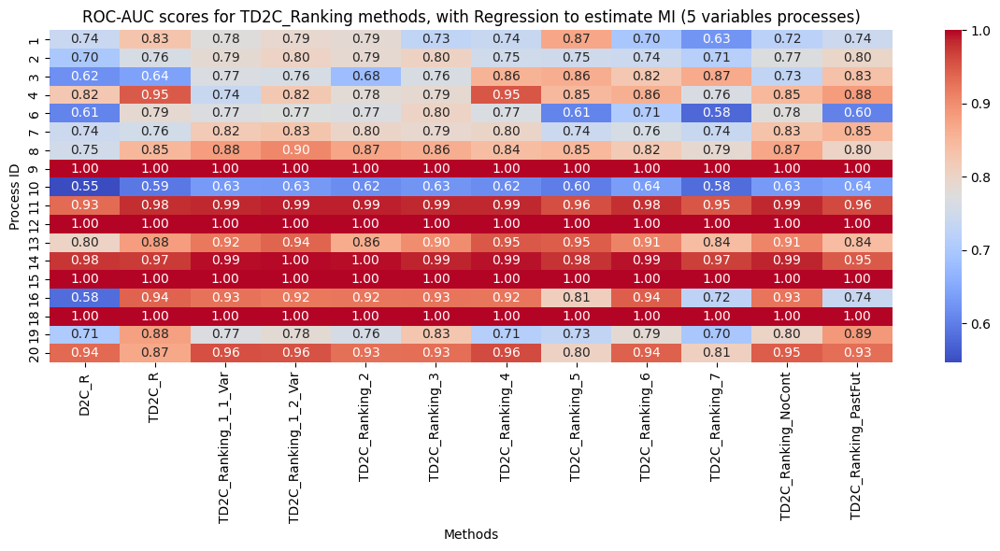

In [63]:
import seaborn as sns

# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('ROC-AUC scores for TD2C_Ranking methods, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/heatmap_TD2C_Ranking.pdf')

plt.show()

In [64]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'roc_auc'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,roc_auc
0,1,0.754452
1,2,0.764064
2,3,0.767230
3,4,0.838498
4,6,0.711770
5,7,0.789049
6,8,0.841727
7,9,1.000000
8,10,0.612296
9,11,0.973766


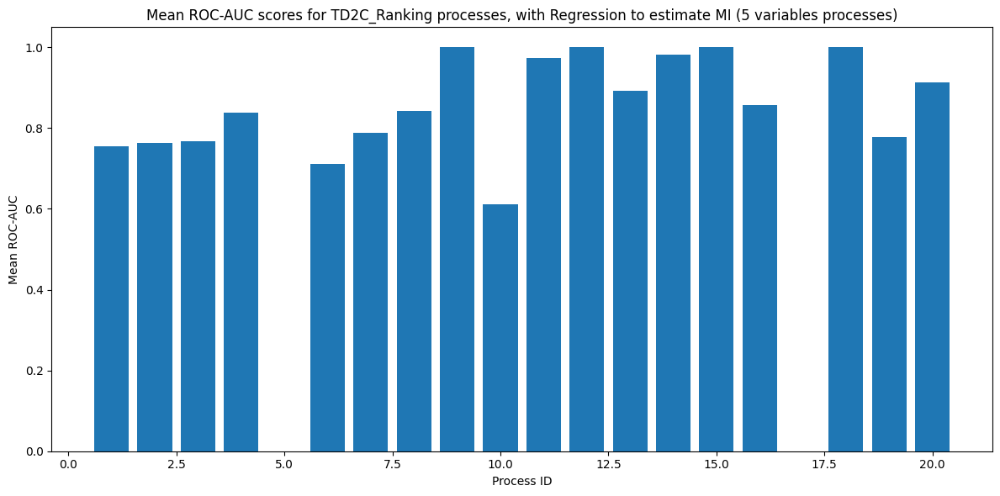

In [65]:
# plot the dataframe as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['roc_auc'])
plt.title('Mean ROC-AUC scores for TD2C_Ranking processes, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Process ID')
plt.ylabel('Mean ROC-AUC')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean_proc.pdf')

plt.show()

In [66]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking.csv')

# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'roc_auc'})

df = df.sort_values(by='roc_auc', ascending=False)

df = df.reset_index(drop=True)

# drop Process ID 0 row
df = df.drop(0)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking_avg.csv', index=False)

df

,method,roc_auc
1,TD2C_Ranking_1_2_Var,0.883526
2,TD2C_Ranking_4,0.880354
3,TD2C_Ranking_NoCont,0.874187
4,TD2C_Ranking_1_1_Var,0.873577
5,TD2C_Ranking_3,0.873380
6,TD2C_R,0.871846
7,TD2C_Ranking_6,0.867173
8,TD2C_Ranking_2,0.864079
9,TD2C_Ranking_PastFut,0.859403
10,TD2C_Ranking_5,0.853142


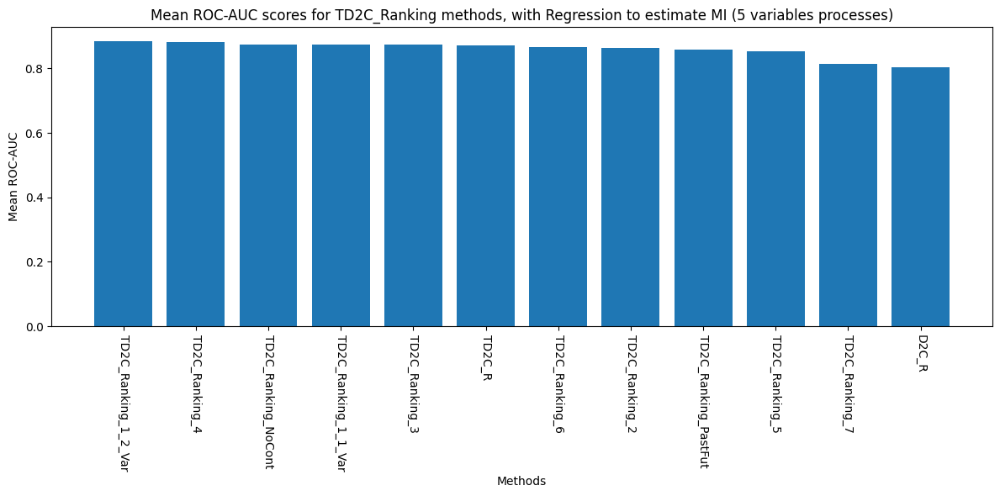

In [82]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/roc_auc_td2c_ranking_avg.csv')

# Plotting Barplot for methods for indexes 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df['method'], df['roc_auc'])
plt.xticks(rotation=-90)
plt.title('Mean ROC-AUC scores for TD2C_Ranking methods, with Regression to estimate MI (5 variables processes)')
plt.xlabel('Methods')
plt.ylabel('Mean ROC-AUC')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_avg.pdf')

plt.show()

### Precision

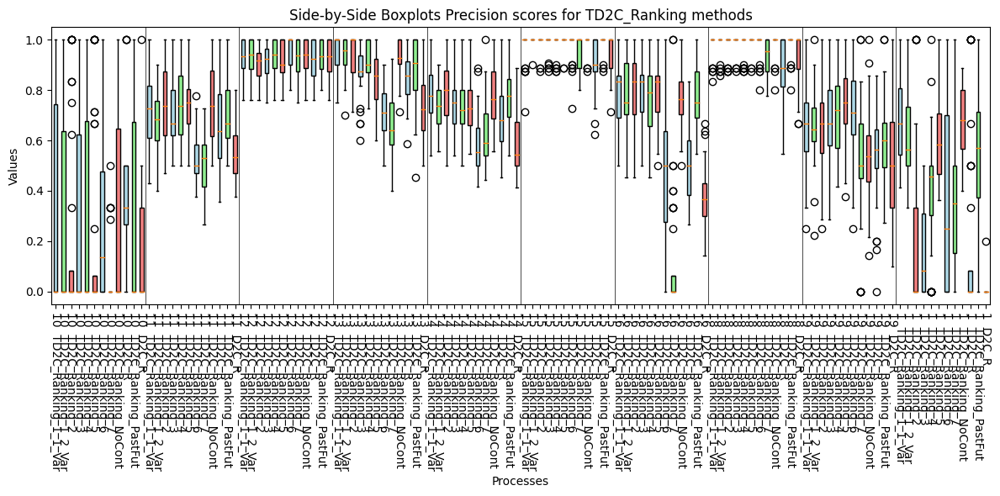

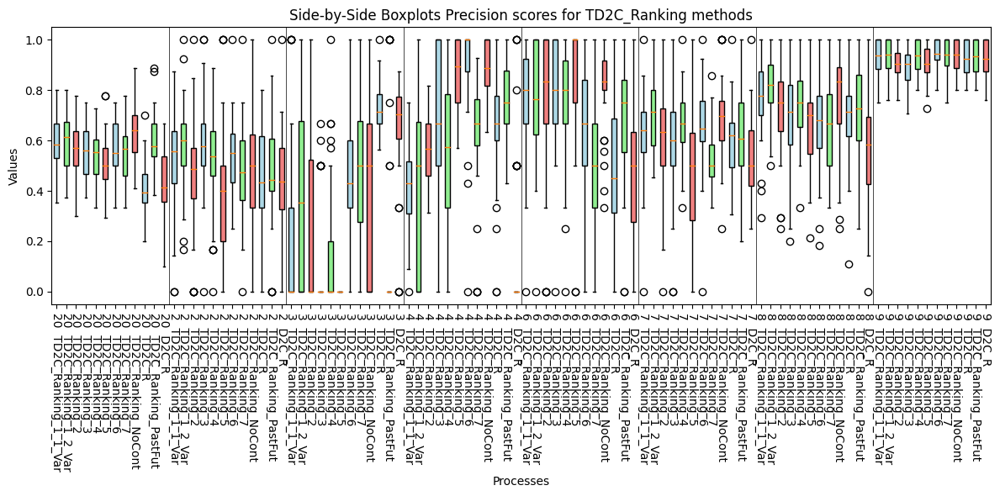

In [84]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_precision_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_precision_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_precision_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_precision_process)
df5 = pd.DataFrame(TD2C_Ranking_2_precision_process)
df6 = pd.DataFrame(TD2C_Ranking_3_precision_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_precision_process)
df8 = pd.DataFrame(TD2C_precision_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_precision_process)
df10 = pd.DataFrame(D2C_precision_process)
df11 = pd.DataFrame(TD2C_Ranking_4_precision_process)
df12 = pd.DataFrame(TD2C_Ranking_5_precision_process)
df13 = pd.DataFrame(TD2C_Ranking_6_precision_process)
df14 = pd.DataFrame(TD2C_Ranking_7_precision_process)

# Combine data for boxplot processes 1-9
combined_data = []

for col in df1.columns[:10]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df11[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[:10]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots Precision scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_1:9.pdf')

plt.show()

# Combine data for boxplot processes 10-20
combined_data = []

for col in df1.columns[10:18]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df11[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[10:18]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots Precision scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_10:18.pdf')

plt.show()

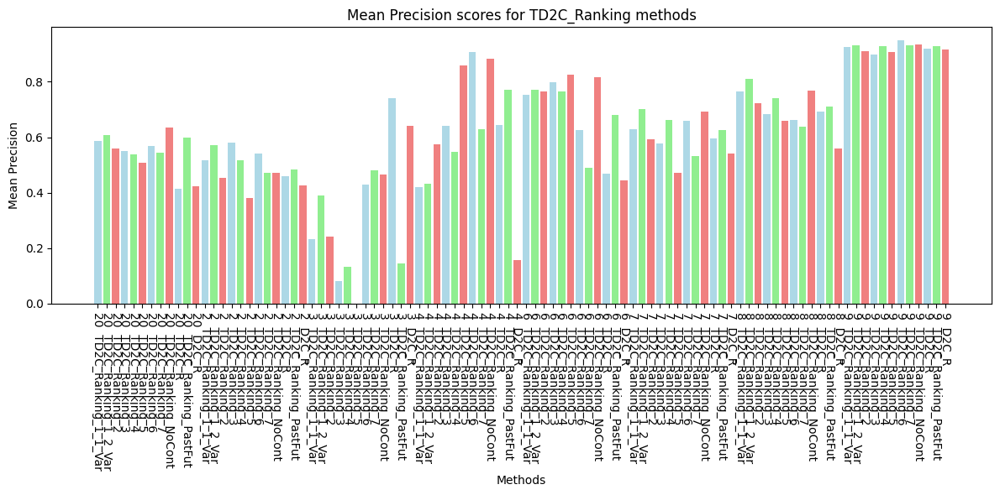

In [85]:
# Plotting Barplot
mean_values = []
for data in combined_data:
    mean_values.append(np.mean(data))

plt.figure(figsize=(12, 6))

plt.bar(labels, mean_values, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Precision scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Precision')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean.pdf')

plt.show()

In [86]:
# NOW SHOW THE PRECISION RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_precision_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_precision_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_precision_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_precision_process)
df5 = pd.DataFrame(TD2C_Ranking_2_precision_process)
df6 = pd.DataFrame(TD2C_Ranking_3_precision_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_precision_process)
df8 = pd.DataFrame(TD2C_precision_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_precision_process)
df10 = pd.DataFrame(D2C_precision_process)
df11 = pd.DataFrame(TD2C_Ranking_4_precision_process)
df12 = pd.DataFrame(TD2C_Ranking_5_precision_process)
df13 = pd.DataFrame(TD2C_Ranking_6_precision_process)
df14 = pd.DataFrame(TD2C_Ranking_7_precision_process)

df1 = df1.T
df2 = df2.T
# df3 = df3.T
# df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T
df11 = df11.T
df12 = df12.T
df13 = df13.T
df14 = df14.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
# df3['method'] = 'TD2C_Ranking_1_3_Var'
# df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'
df11['method'] = 'TD2C_Ranking_4'
df12['method'] = 'TD2C_Ranking_5'
df13['method'] = 'TD2C_Ranking_6'
df14['method'] = 'TD2C_Ranking_7'

df = pd.concat([df1, df2, df5, df6, df11, df7, df12, df13, df14, df8, df9, df10]) # df3, df4,

df = df.reset_index()
df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='precision')

df['precision'] = df['precision'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='precision')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_Ranking_1_1_Var_precision_process': 'TD2C_Ranking_1_1_Var_precision_process',
                        'TD2C_Ranking_1_2_Var_precision_process': 'TD2C_Ranking_1_2_Var_precision_process',
                        # 'TD2C_Ranking_1_3_Var_precision_process': 'TD2C_Ranking_1_3_Var_precision_process',
                        # 'TD2C_Ranking_1_10_Var_precision_process': 'TD2C_Ranking_1_10_Var_precision_process',
                        'TD2C_Ranking_2_precision_process': 'TD2C_Ranking_2_precision_process',
                        'TD2C_Ranking_3_precision_process': 'TD2C_Ranking_3_precision_process',
                        'TD2C_Ranking_4_precision_process': 'TD2C_Ranking_4_precision_process',
                        'TD2C_Ranking_5_precision_process': 'TD2C_Ranking_5_precision_process',
                        'TD2C_Ranking_6_precision_process': 'TD2C_Ranking_6_precision_process',
                        'TD2C_Ranking_7_precision_process': 'TD2C_Ranking_7_precision_process', 
                        'TD2C_Ranking_NoCont_precision_process': 'TD2C_Ranking_NoCont_precision_process',
                        'TD2C_R_precision_process': 'TD2C_R_precision_process',
                        'TD2C_Ranking_PastFut_precision_process': 'TD2C_Ranking_PastFut_precision_process',
                        'D2C_R_precision_process': 'D2C_R_precision_process'})


# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_62016/2466353414.py:56: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_4,TD2C_Ranking_5,TD2C_Ranking_6,TD2C_Ranking_7,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.351590,0.611294,0.691583,0.621413,0.181875,0.163841,0.677615,0.187500,0.555780,0.005000,0.393927,0.368810
1,2,0.472477,0.380730,0.517569,0.571711,0.453700,0.580793,0.472339,0.458175,0.484106,0.427567,0.518416,0.540990
2,3,0.479871,0.000000,0.231667,0.389018,0.241944,0.081667,0.464692,0.740705,0.143750,0.640505,0.133036,0.429375
3,4,0.627431,0.858614,0.420298,0.433449,0.575201,0.642083,0.881555,0.643166,0.770882,0.157500,0.547108,0.908234
4,6,0.490506,0.826607,0.754117,0.770027,0.765744,0.798065,0.816089,0.468056,0.681776,0.444196,0.763935,0.624812
5,7,0.532769,0.472624,0.628207,0.701290,0.591916,0.577363,0.691435,0.596447,0.625680,0.539732,0.663636,0.659743
6,8,0.637415,0.660033,0.763742,0.809555,0.721327,0.683438,0.767585,0.692821,0.711215,0.557925,0.740998,0.662747
7,9,0.932632,0.908214,0.924977,0.931677,0.911094,0.899412,0.933251,0.920170,0.927913,0.916717,0.928405,0.949482
8,10,0.044643,0.200298,0.299827,0.260982,0.209375,0.230060,0.301771,0.370261,0.321190,0.151811,0.287649,0.276061
9,11,0.505737,0.738926,0.720292,0.683246,0.744955,0.707604,0.743648,0.658339,0.696081,0.542591,0.751146,0.531013


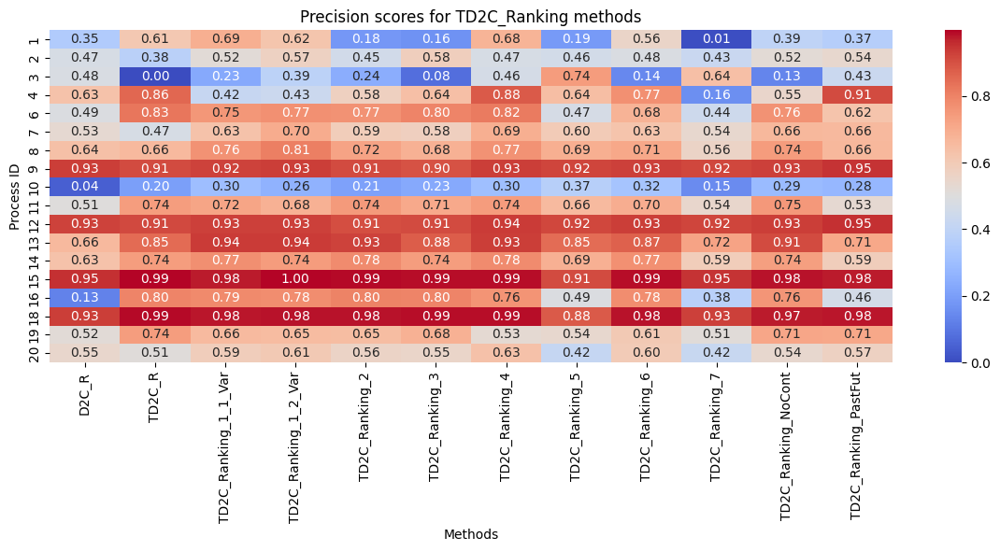

In [87]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Precision scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/heatmap_TD2C_Ranking_precision.pdf')

plt.show()

In [89]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'precision'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,precision
0,1,0.400852
1,2,0.489881
2,3,0.331353
3,4,0.622127
4,6,0.683661
5,7,0.606737
6,8,0.700733
7,9,0.923662
8,10,0.246161
9,11,0.668631


Index(['Process ID', 'D2C_R', 'TD2C_R', 'TD2C_Ranking_1_1_Var',
       'TD2C_Ranking_1_2_Var', 'TD2C_Ranking_2', 'TD2C_Ranking_3',
       'TD2C_Ranking_4', 'TD2C_Ranking_5', 'TD2C_Ranking_6', 'TD2C_Ranking_7',
       'TD2C_Ranking_NoCont', 'TD2C_Ranking_PastFut'],
      dtype='object')


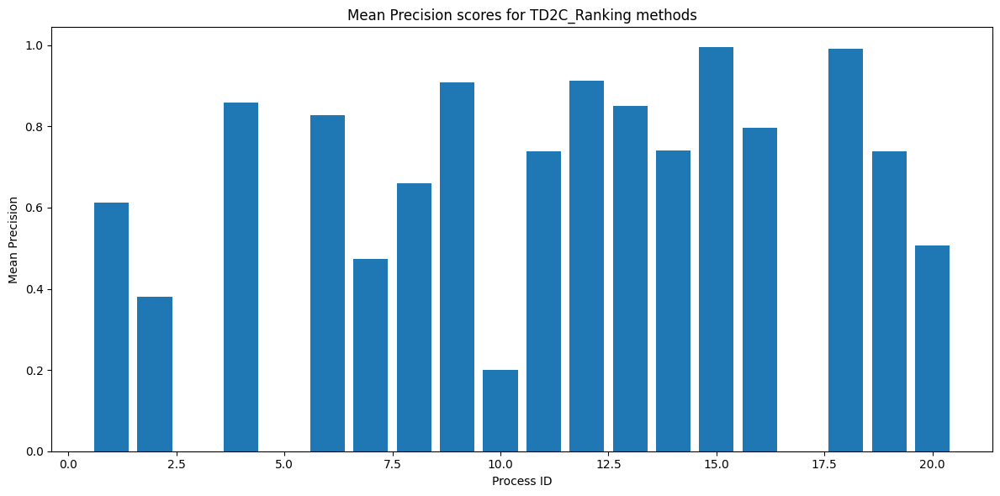

In [96]:
# Load the DataFrame
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking.csv')

# Plot the DataFrame as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['TD2C_R'])
plt.title('Mean Precision scores for TD2C_Ranking methods')
plt.xlabel('Process ID')
plt.ylabel('Mean Precision')
plt.tight_layout()

# Save the plot as a PDF in the folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean_proc.pdf')

plt.show()

In [97]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking.csv')

# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'precision'})

df = df.sort_values(by='precision', ascending=False)

df = df.reset_index(drop=True)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking_avg.csv', index=False)

df


,method,precision
0,Process ID,10.444444
1,TD2C_Ranking_4,0.738842
2,TD2C_Ranking_1_2_Var,0.711279
3,TD2C_Ranking_1_1_Var,0.698812
4,TD2C_Ranking_6,0.691457
5,TD2C_Ranking_NoCont,0.682190
6,TD2C_R,0.677154
7,TD2C_Ranking_2,0.666158
8,TD2C_Ranking_PastFut,0.661065
9,TD2C_Ranking_3,0.661021


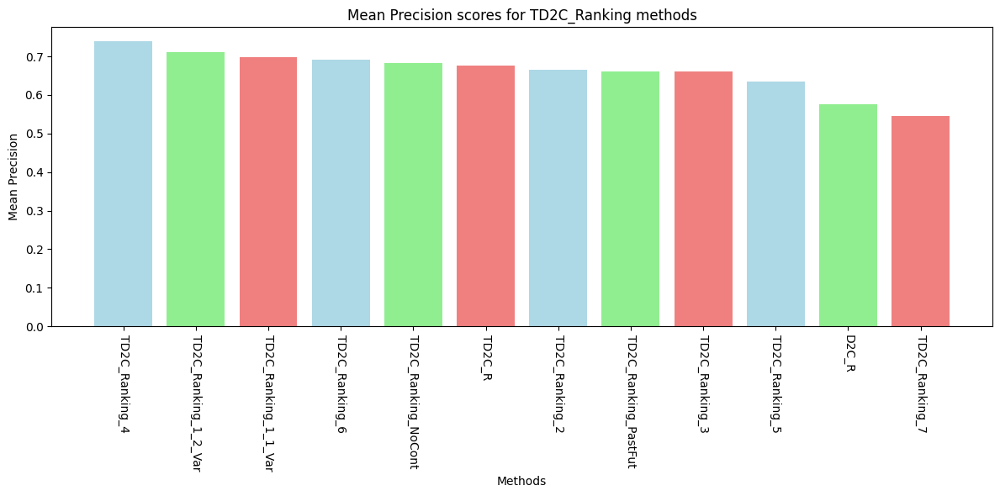

In [98]:
# load the data from csv files
df_prec = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/precision_td2c_ranking_avg.csv')

# Barplot for precision scores from index 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df_prec['method'][1:], df_prec['precision'][1:], color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Precision scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Precision')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_avg_precision.pdf')

plt.show()

### Recall

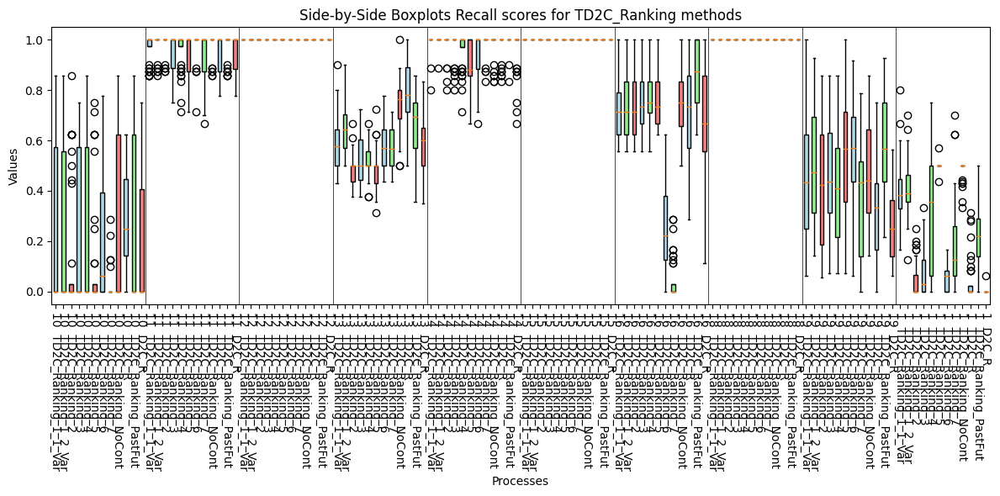

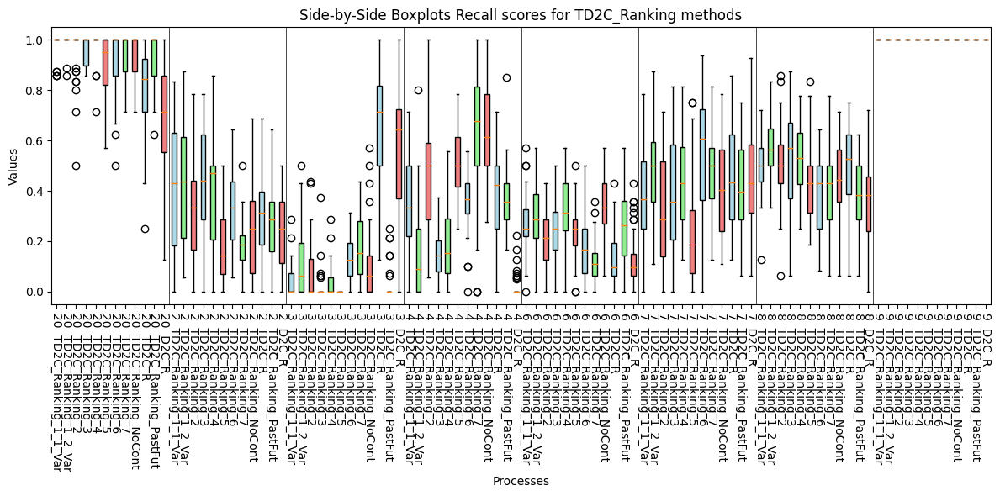

In [100]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_recall_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_recall_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_recall_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_recall_process)
df5 = pd.DataFrame(TD2C_Ranking_2_recall_process)
df6 = pd.DataFrame(TD2C_Ranking_3_recall_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_recall_process)
df8 = pd.DataFrame(TD2C_recall_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_recall_process)
df10 = pd.DataFrame(D2C_recall_process)
df11 = pd.DataFrame(TD2C_Ranking_4_recall_process)
df12 = pd.DataFrame(TD2C_Ranking_5_recall_process)
df13 = pd.DataFrame(TD2C_Ranking_6_recall_process)
df14 = pd.DataFrame(TD2C_Ranking_7_recall_process)

# Combine data for boxplot processes 1-9
combined_data = []

for col in df1.columns[:10]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df11[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[:10]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots Recall scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_recall_1:9.pdf')

plt.show()


# Combine data for boxplot processes 10-20
combined_data = []

for col in df1.columns[10:18]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df11[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[10:18]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots Recall scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_recall_10:18.pdf')

plt.show()

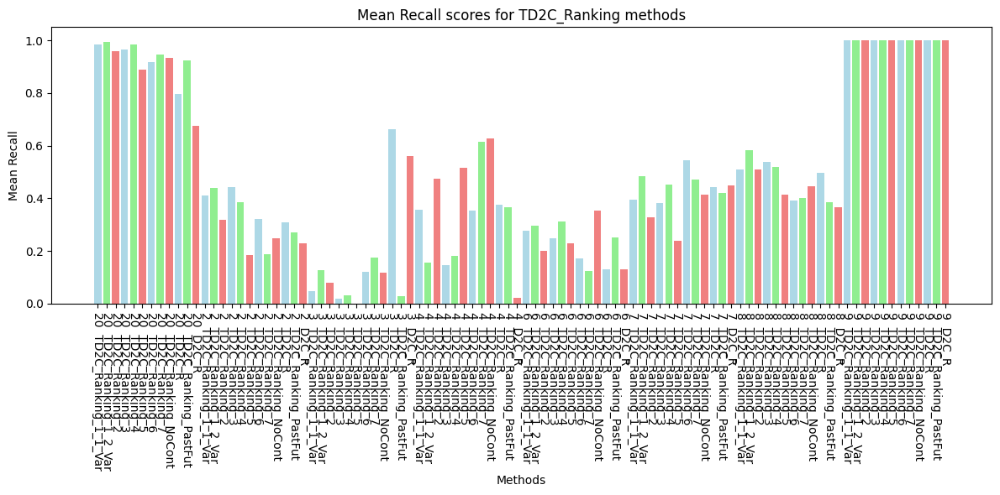

In [101]:
# Plotting Barplot
mean_values = []
for data in combined_data:
    mean_values.append(np.mean(data))

plt.figure(figsize=(12, 6))
plt.bar(labels, mean_values, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Recall scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Recall')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean_recall.pdf')

plt.show()

In [103]:
# NOW SHOW THE RECALL RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_recall_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_recall_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_recall_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_recall_process)
df5 = pd.DataFrame(TD2C_Ranking_2_recall_process)
df6 = pd.DataFrame(TD2C_Ranking_3_recall_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_recall_process)
df8 = pd.DataFrame(TD2C_recall_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_recall_process)
df10 = pd.DataFrame(D2C_recall_process)
df11 = pd.DataFrame(TD2C_Ranking_4_recall_process)
df12 = pd.DataFrame(TD2C_Ranking_5_recall_process)
df13 = pd.DataFrame(TD2C_Ranking_6_recall_process)
df14 = pd.DataFrame(TD2C_Ranking_7_recall_process)

df1 = df1.T
df2 = df2.T
# df3 = df3.T
# df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T
df11 = df11.T
df12 = df12.T
df13 = df13.T
df14 = df14.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
# df3['method'] = 'TD2C_Ranking_1_3_Var'
# df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df11['method'] = 'TD2C_Ranking_4'
df12['method'] = 'TD2C_Ranking_5'
df13['method'] = 'TD2C_Ranking_6'
df14['method'] = 'TD2C_Ranking_7'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'


df = pd.concat([df1, df2, df5, df6, df11, df7, df12, df13, df14, df8, df9, df10]) #, df3, df4,

df = df.reset_index()

df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='recall')

df['recall'] = df['recall'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='recall')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_Ranking_1_1_Var_recall_process': 'TD2C_Ranking_1_1_Var_recall_process',
                        'TD2C_Ranking_1_2_Var_recall_process': 'TD2C_Ranking_1_2_Var_recall_process',
                        # 'TD2C_Ranking_1_3_Var_recall_process': 'TD2C_Ranking_1_3_Var_recall_process',
                        # 'TD2C_Ranking_1_10_Var_recall_process': 'TD2C_Ranking_1_10_Var_recall_process',
                        'TD2C_Ranking_2_recall_process': 'TD2C_Ranking_2_recall_process',
                        'TD2C_Ranking_3_recall_process': 'TD2C_Ranking_3_recall_process',
                        'TD2C_Ranking_4_recall_process': 'TD2C_Ranking_4_recall_process',
                        'TD2C_Ranking_5_recall_process': 'TD2C_Ranking_5_recall_process',
                        'TD2C_Ranking_6_recall_process': 'TD2C_Ranking_6_recall_process',
                        'TD2C_Ranking_7_recall_process': 'TD2C_Ranking_7_recall_process',
                        'TD2C_Ranking_NoCont_recall_process': 'TD2C_Ranking_NoCont_recall_process',
                        'TD2C_R_recall_process': 'TD2C_R_recall_process',
                        'TD2C_Ranking_PastFut_recall_process': 'TD2C_Ranking_PastFut_recall_process',
                        'D2C_R_recall_process': 'D2C_R_recall_process'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_62016/3427307927.py:58: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_4,TD2C_Ranking_5,TD2C_Ranking_6,TD2C_Ranking_7,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.179653,0.500223,0.401334,0.411999,0.041553,0.074901,0.483656,0.042703,0.227178,0.001563,0.289861,0.049648
1,2,0.187649,0.183259,0.409524,0.439906,0.318403,0.442510,0.249628,0.308904,0.269147,0.229117,0.385913,0.320164
2,3,0.175694,0.000000,0.046379,0.127654,0.079092,0.019246,0.117336,0.662376,0.027455,0.560813,0.031076,0.121974
3,4,0.614945,0.515079,0.356255,0.156731,0.473770,0.146786,0.628046,0.373929,0.366811,0.022307,0.181592,0.352009
4,6,0.124678,0.229836,0.277381,0.297396,0.201637,0.249479,0.352331,0.129886,0.251984,0.130605,0.312525,0.172917
5,7,0.469742,0.237798,0.393155,0.484648,0.328100,0.382639,0.412525,0.442560,0.419643,0.449231,0.450620,0.543874
6,8,0.402604,0.413914,0.509821,0.582788,0.509077,0.537847,0.444916,0.497470,0.384053,0.365427,0.517758,0.391121
7,9,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
8,10,0.021448,0.116319,0.196815,0.190913,0.134921,0.184673,0.243294,0.290595,0.246220,0.174931,0.208065,0.196776
9,11,0.938879,0.941151,0.968284,0.982123,0.982917,0.959355,0.981052,0.942391,0.974633,0.953879,0.960992,0.980704


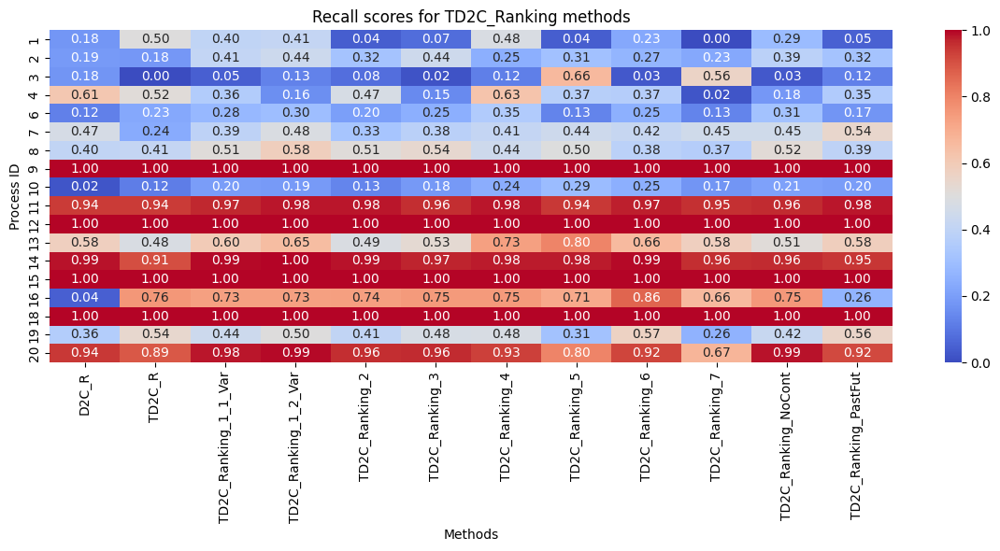

In [104]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Recall scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/heatmap_TD2C_Ranking_recall.pdf')

plt.show()

In [105]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'recall'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,recall
0,1,0.225356
1,2,0.312010
2,3,0.164091
3,4,0.349022
4,6,0.227555
5,7,0.417878
6,8,0.463066
7,9,1.000000
8,10,0.183748
9,11,0.963863


In [107]:
print(df.columns)

Index(['Process ID', 'D2C_R', 'TD2C_R', 'TD2C_Ranking_1_1_Var',
       'TD2C_Ranking_1_2_Var', 'TD2C_Ranking_2', 'TD2C_Ranking_3',
       'TD2C_Ranking_4', 'TD2C_Ranking_5', 'TD2C_Ranking_6', 'TD2C_Ranking_7',
       'TD2C_Ranking_NoCont', 'TD2C_Ranking_PastFut'],
      dtype='object')


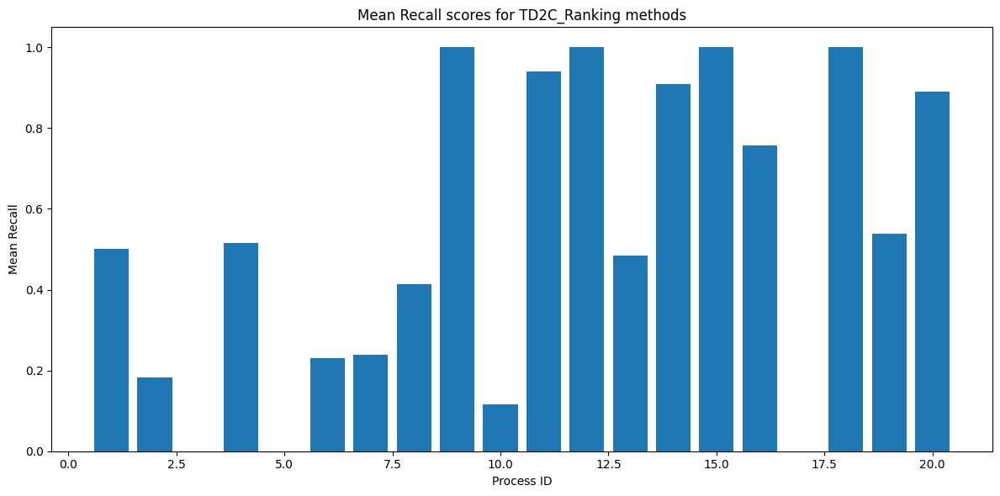

In [108]:
# Load the DataFrame
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking.csv')

# Plot the DataFrame as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['TD2C_R'])
plt.title('Mean Recall scores for TD2C_Ranking methods')
plt.xlabel('Process ID')
plt.ylabel('Mean Recall')
plt.tight_layout()

# Save the plot as a PDF in the folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean_proc_recall.pdf')

plt.show()

In [109]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking.csv')


# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'recall'})

df = df.sort_values(by='recall', ascending=False)

df = df.reset_index(drop=True)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking_avg.csv', index=False)

df

,method,recall
0,Process ID,10.444444
1,TD2C_Ranking_4,0.654705
2,TD2C_Ranking_1_2_Var,0.641731
3,TD2C_Ranking_1_1_Var,0.627997
4,TD2C_Ranking_5,0.627104
5,TD2C_Ranking_6,0.620990
6,TD2C_Ranking_NoCont,0.609569
7,TD2C_R,0.595322
8,TD2C_Ranking_3,0.593743
9,TD2C_Ranking_2,0.591259


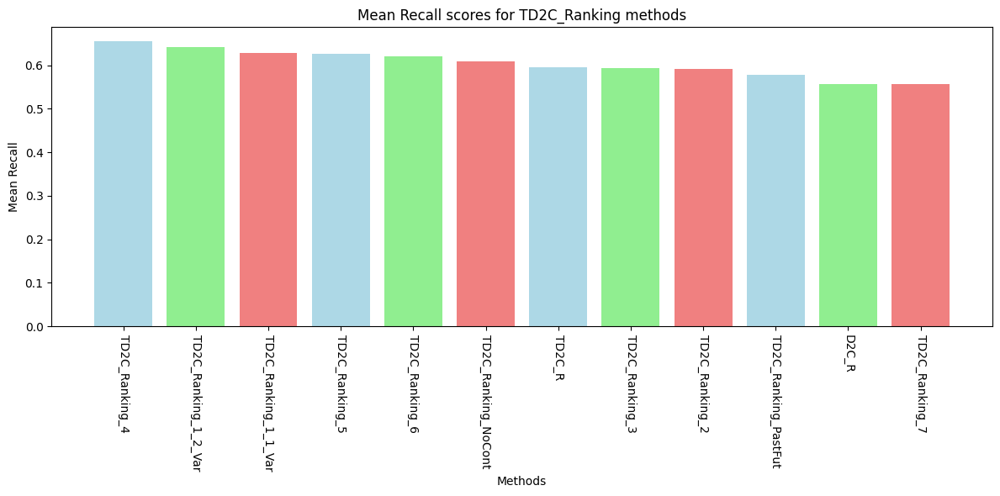

In [110]:
# load the data from csv files
df_recall = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/recall_td2c_ranking_avg.csv')

# Barplot for recall scores from index 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df_recall['method'][1:], df_recall['recall'][1:], color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Recall scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Recall')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_avg_recall.pdf')

plt.show()

### F1

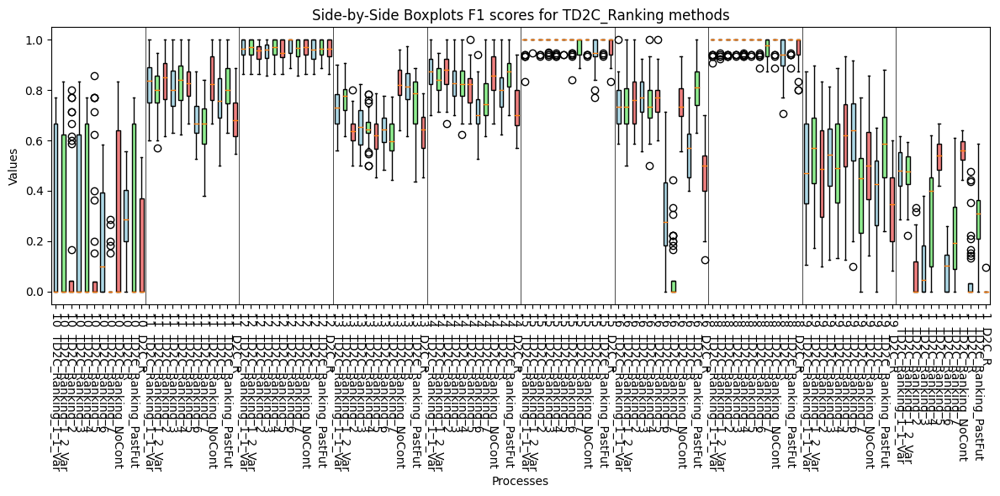

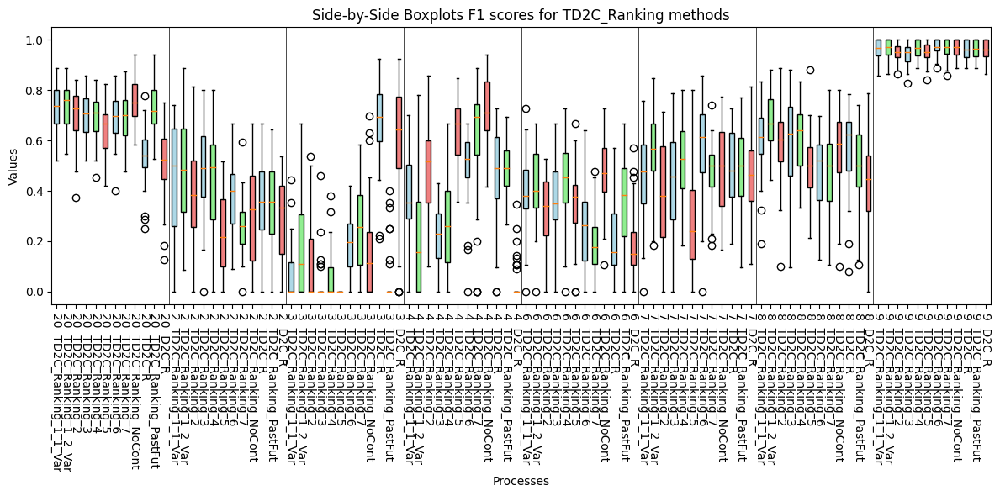

In [111]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_f1_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_f1_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_f1_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_f1_process)
df5 = pd.DataFrame(TD2C_Ranking_2_f1_process)
df6 = pd.DataFrame(TD2C_Ranking_3_f1_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_f1_process)
df8 = pd.DataFrame(TD2C_f1_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_f1_process)
df10 = pd.DataFrame(D2C_f1_process)
df11 = pd.DataFrame(TD2C_Ranking_4_f1_process)
df12 = pd.DataFrame(TD2C_Ranking_5_f1_process)
df13 = pd.DataFrame(TD2C_Ranking_6_f1_process)
df14 = pd.DataFrame(TD2C_Ranking_7_f1_process)

# Combine data for boxplot processes 1-9
combined_data = []

for col in df1.columns[:10]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df11[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []

for col in df1.columns[:10]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')
    

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']

for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots F1 scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_f1_1:9.pdf')

plt.show()

 
# Combine data for boxplot processes 10-20
combined_data = []

for col in df1.columns[10:18]:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df11[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []

for col in df1.columns[10:18]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')
    

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']

for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots F1 scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(12, len(labels), 12):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/boxplot_TD2C_Ranking_f1_10:18.pdf')

plt.show()


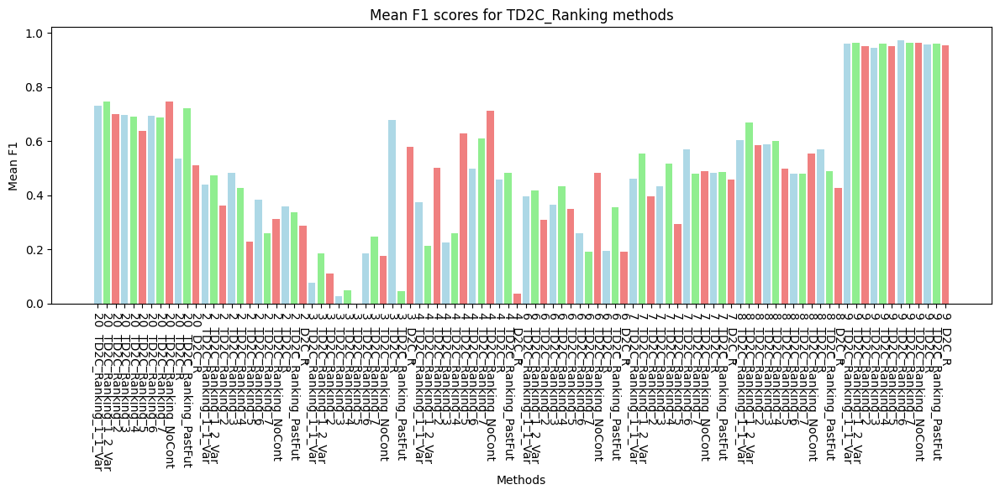

In [112]:
# Plotting Barplot
mean_values = []
for data in combined_data:
    mean_values.append(np.mean(data))

plt.figure(figsize=(12, 6))
plt.bar(labels, mean_values, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean F1 scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean F1')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean_f1.pdf')

plt.show()

In [113]:
# NOW SHOW THE F1 RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_f1_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_f1_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_f1_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_f1_process)
df5 = pd.DataFrame(TD2C_Ranking_2_f1_process)
df6 = pd.DataFrame(TD2C_Ranking_3_f1_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_f1_process)
df8 = pd.DataFrame(TD2C_f1_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_f1_process)
df10 = pd.DataFrame(D2C_f1_process)
df11 = pd.DataFrame(TD2C_Ranking_4_f1_process)
df12 = pd.DataFrame(TD2C_Ranking_5_f1_process)
df13 = pd.DataFrame(TD2C_Ranking_6_f1_process)
df14 = pd.DataFrame(TD2C_Ranking_7_f1_process)

df1 = df1.T
df2 = df2.T
# df3 = df3.T
# df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T
df11 = df11.T
df12 = df12.T
df13 = df13.T
df14 = df14.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
# df3['method'] = 'TD2C_Ranking_1_3_Var'
# df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df11['method'] = 'TD2C_Ranking_4'
df12['method'] = 'TD2C_Ranking_5'
df13['method'] = 'TD2C_Ranking_6'
df14['method'] = 'TD2C_Ranking_7'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'

df = pd.concat([df1, df2, df5, df6, df11, df7, df12, df13, df14, df8, df9, df10]) #, df3, df4,

df = df.reset_index()
df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='f1')

df['f1'] = df['f1'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='f1')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_Ranking_1_1_Var_f1_process': 'TD2C_Ranking_1_1_Var_f1_process',
                        'TD2C_Ranking_1_2_Var_f1_process': 'TD2C_Ranking_1_2_Var_f1_process',
                        # 'TD2C_Ranking_1_3_Var_f1_process': 'TD2C_Ranking_1_3_Var_f1_process',
                        # 'TD2C_Ranking_1_10_Var_f1_process': 'TD2C_Ranking_1_10_Var_f1_process',
                        'TD2C_Ranking_2_f1_process': 'TD2C_Ranking_2_f1_process',
                        'TD2C_Ranking_3_f1_process': 'TD2C_Ranking_3_f1_process',
                        'TD2C_Ranking_4_f1_process': 'TD2C_Ranking_4_f1_process',
                        'TD2C_Ranking_5_f1_process': 'TD2C_Ranking_5_f1_process',
                        'TD2C_Ranking_6_f1_process': 'TD2C_Ranking_6_f1_process',
                        'TD2C_Ranking_7_f1_process': 'TD2C_Ranking_7_f1_process',
                        'TD2C_Ranking_NoCont_f1_process': 'TD2C_Ranking_NoCont_f1_process',
                        'TD2C_R_f1_process': 'TD2C_R_f1_process',
                        'TD2C_Ranking_PastFut_f1_process': 'TD2C_Ranking_PastFut_f1_process',
                        'D2C_R_f1_process': 'D2C_R_f1_process'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_62016/1294807296.py:56: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_4,TD2C_Ranking_5,TD2C_Ranking_6,TD2C_Ranking_7,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.216095,0.540865,0.482644,0.473677,0.061805,0.096058,0.555821,0.068445,0.302626,0.002381,0.308374,0.084419
1,2,0.259610,0.230352,0.439626,0.474047,0.361127,0.483096,0.312075,0.360734,0.337093,0.287394,0.427434,0.383449
2,3,0.247944,0.000000,0.075926,0.185582,0.112680,0.028601,0.176099,0.678931,0.045560,0.579416,0.048129,0.184577
3,4,0.610825,0.630310,0.375039,0.212884,0.501464,0.226886,0.712946,0.458028,0.484274,0.037164,0.258850,0.498363
4,6,0.193081,0.349930,0.397389,0.417802,0.309509,0.364571,0.483882,0.193801,0.355961,0.190893,0.435177,0.259939
5,7,0.479637,0.295407,0.462670,0.555141,0.395062,0.433053,0.489928,0.482162,0.485824,0.458613,0.517075,0.570894
6,8,0.480524,0.497574,0.604253,0.670576,0.586697,0.590041,0.554045,0.569643,0.490520,0.427806,0.600025,0.480915
7,9,0.963947,0.950398,0.959826,0.963590,0.952231,0.945386,0.964492,0.957382,0.961551,0.955288,0.961853,0.973255
8,10,0.027201,0.140540,0.225435,0.214274,0.160100,0.203636,0.263499,0.289166,0.261994,0.149238,0.236139,0.195643
9,11,0.650531,0.819603,0.817711,0.797829,0.838343,0.808224,0.836857,0.762696,0.805068,0.685602,0.836233,0.683880


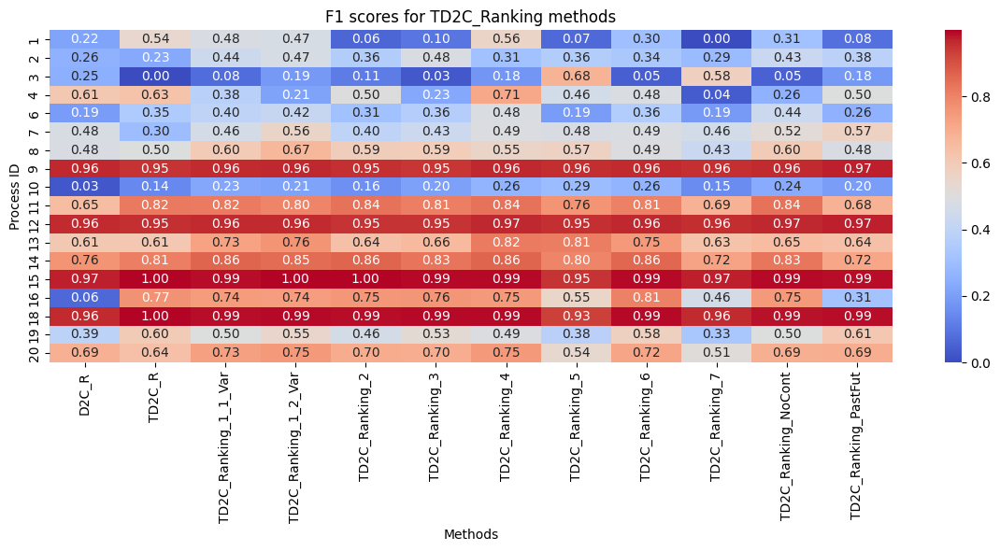

In [114]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('F1 scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/heatmap_TD2C_Ranking_f1.pdf')

plt.show()

In [115]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'f1'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,f1
0,1,0.266101
1,2,0.363003
2,3,0.196954
3,4,0.417253
4,6,0.329328
5,7,0.468789
6,8,0.546052
7,9,0.959100
8,10,0.197239
9,11,0.778548


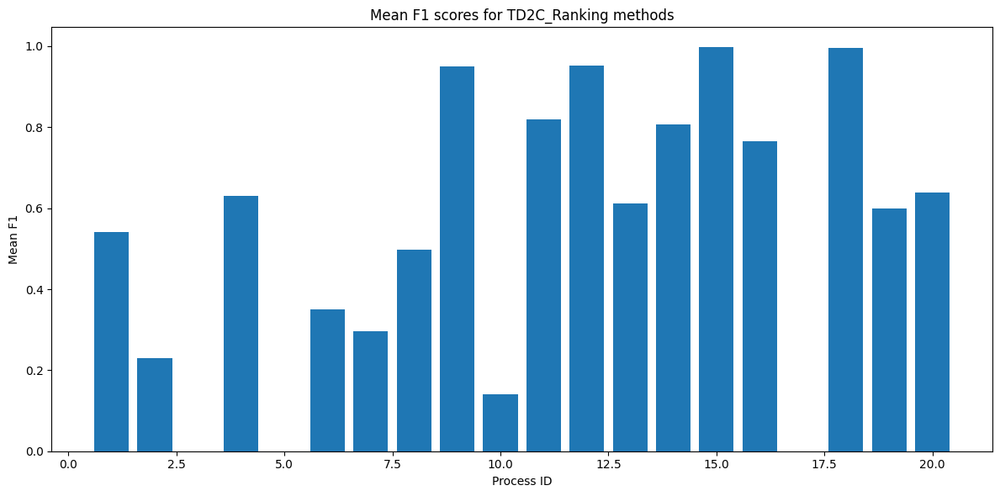

In [117]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking.csv')

# plot the dataframe as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['TD2C_R'])
plt.title('Mean F1 scores for TD2C_Ranking methods')
plt.xlabel('Process ID')
plt.ylabel('Mean F1')
plt.tight_layout()

# Save the plot as a PDF in the folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_mean_proc_f1.pdf')

plt.show()

In [118]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking.csv')


# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'f1'})

df = df.sort_values(by='f1', ascending=False)

df = df.reset_index(drop=True)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking_avg.csv', index=False)

df

,method,f1
0,Process ID,10.444444
1,TD2C_Ranking_4,0.664577
2,TD2C_Ranking_1_2_Var,0.642530
3,TD2C_Ranking_1_1_Var,0.630039
4,TD2C_Ranking_6,0.621813
5,TD2C_Ranking_NoCont,0.610467
6,TD2C_R,0.601356
7,TD2C_Ranking_5,0.596607
8,TD2C_Ranking_2,0.590697
9,TD2C_Ranking_3,0.588289


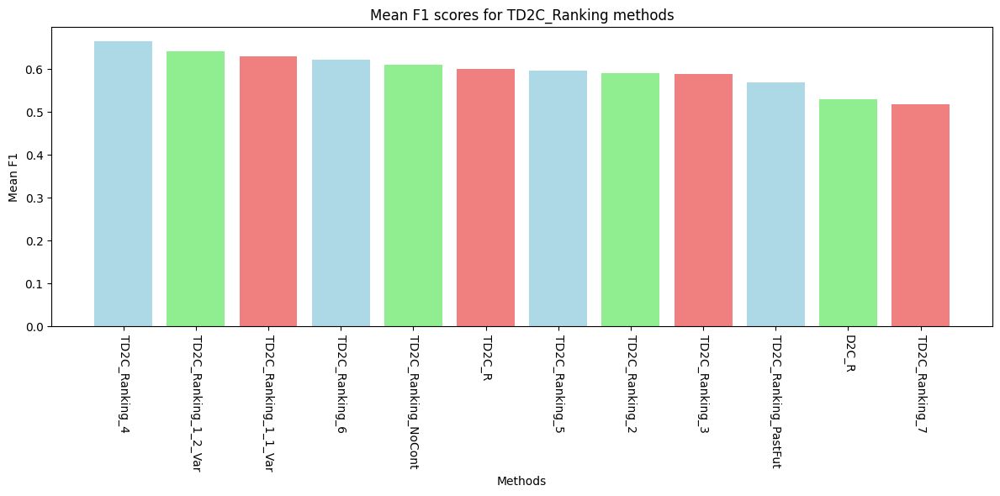

In [119]:
# load the data from csv files
df_f1 = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/metrics/f1_td2c_ranking_avg.csv')

# Barplot for f1 scores from index 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df_f1['method'][1:], df_f1['f1'][1:], color=colors)
plt.xticks(rotation=-90)
plt.title('Mean F1 scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean F1')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/Regression/plots/barplot_TD2C_Ranking_avg_f1.pdf')

plt.show()

## KnnCMI for MI estimation

### ROC-AUC

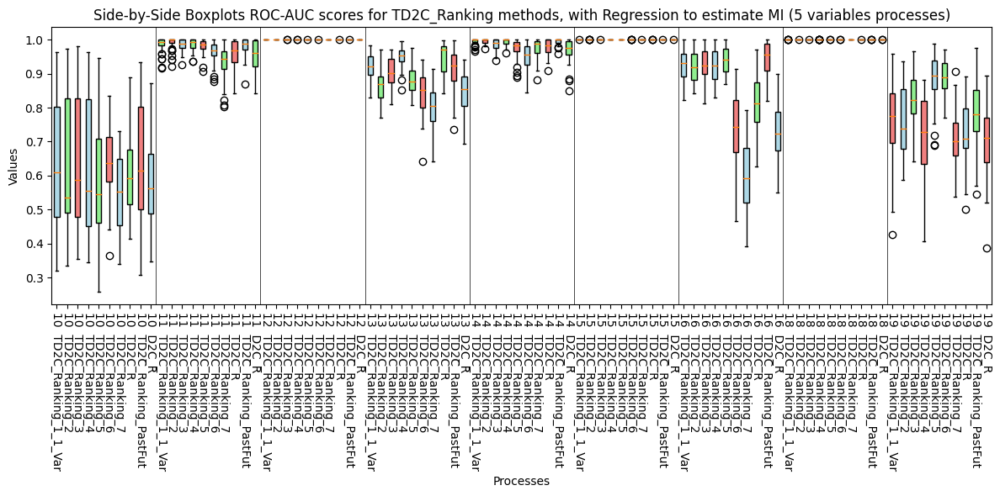

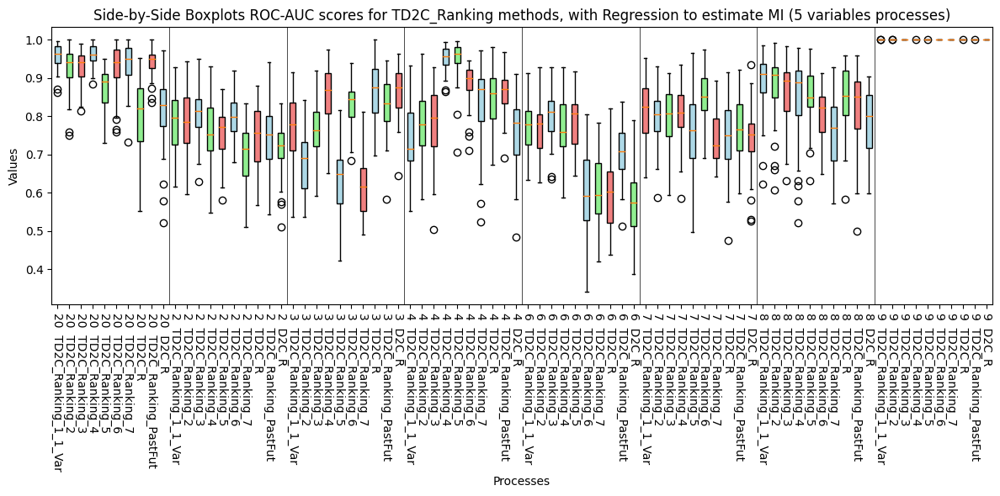

In [ ]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_rocs_process)
# df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_rocs_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_rocs_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_rocs_process)
df5 = pd.DataFrame(TD2C_Ranking_2_rocs_process)
df6 = pd.DataFrame(TD2C_Ranking_3_rocs_process)
# df7 = pd.DataFrame(TD2C_Ranking_NoCont_rocs_process)
df8 = pd.DataFrame(TD2C_rocs_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)
df10 = pd.DataFrame(D2C_rocs_process)
df11 = pd.DataFrame(TD2C_Ranking_4_rocs_process)
df12 = pd.DataFrame(TD2C_Ranking_5_rocs_process)
df13 = pd.DataFrame(TD2C_Ranking_6_rocs_process)
df14 = pd.DataFrame(TD2C_Ranking_7_rocs_process)


# Processes 1-9

# Combine data for boxplot
combined_data = []

# Use only the first 9 columns (processes)
for col in df5.columns[:9]:
    combined_data.append(df1[col])
    # combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df11[col])
    # combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[:9]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    # labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting Boxplot
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots ROC-AUC scores for TD2C_Ranking methods, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# Add a vertical line every 6 boxes
for i in range(10, len(labels), 10):
    plt.axvline(x=i + 0.5, color='black', linewidth=0.5)

# Save the plot as a pdf in folder (optional)
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/plots/boxplot_TD2C_Ranking_1:9.pdf')

plt.show()


# Processes 10-20

combined_data = []

# Use only the first 9 columns (processes)
for col in df5.columns[10:18]:
    combined_data.append(df1[col])
    # combined_data.append(df2[col])
    # combined_data.append(df3[col])
    # combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df11[col])
    # combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])
    combined_data.append(df12[col])
    combined_data.append(df13[col])
    combined_data.append(df14[col])

# Create labels for x-axis
labels = []
for col in df1.columns[10:18]:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    # labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_4')
    labels.append(f'{col}  TD2C_Ranking_5')
    labels.append(f'{col}  TD2C_Ranking_6')
    labels.append(f'{col}  TD2C_Ranking_7')
    # labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting Boxplot
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots ROC-AUC scores for TD2C_Ranking methods, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# Add a vertical line every 6 boxes
for i in range(10, len(labels), 10):
    plt.axvline(x=i + 0.5, color='black', linewidth=0.5)

# Save the plot as a pdf in folder (optional)
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/plots/boxplot_TD2C_Ranking_10:18.pdf')

plt.show()


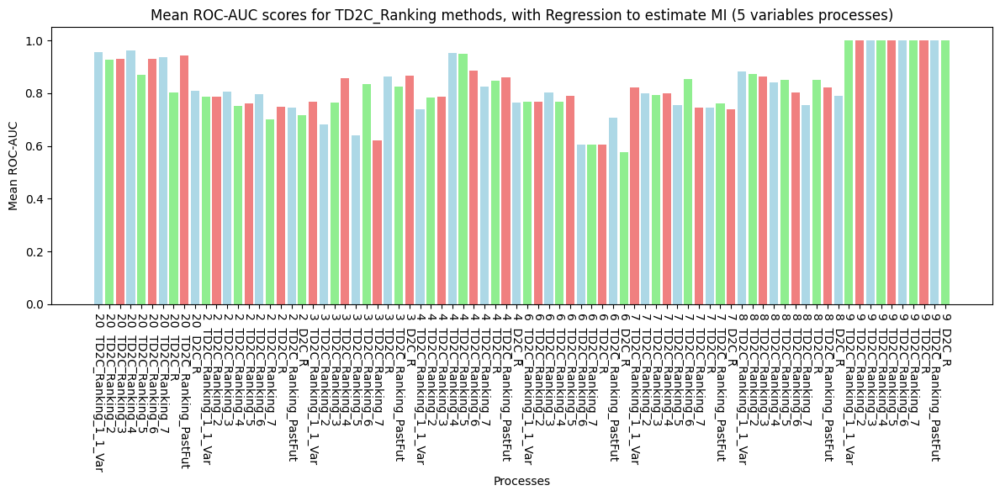

In [ ]:
# Barplot the mean of the ROC-AUC scores
plt.figure(figsize=(12, 6))
means = [df.mean().mean() for df in combined_data]
plt.bar(labels, means, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean ROC-AUC scores for TD2C_Ranking methods, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Processes')
plt.ylabel('Mean ROC-AUC')
plt.tight_layout()


# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/plots/barplot_TD2C_Ranking.pdf')

plt.show()

In [ ]:
# NOW SHOW THE ROUC-AUC RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_rocs_process)
# df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_rocs_process)
# df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_rocs_process)
# df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_rocs_process)
df5 = pd.DataFrame(TD2C_Ranking_2_rocs_process)
df6 = pd.DataFrame(TD2C_Ranking_3_rocs_process)
# df7 = pd.DataFrame(TD2C_Ranking_NoCont_rocs_process)
df8 = pd.DataFrame(TD2C_rocs_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_rocs_process)
df10 = pd.DataFrame(D2C_rocs_process)
df11 = pd.DataFrame(TD2C_Ranking_4_rocs_process)
df12 = pd.DataFrame(TD2C_Ranking_5_rocs_process)
df13 = pd.DataFrame(TD2C_Ranking_6_rocs_process)
df14 = pd.DataFrame(TD2C_Ranking_7_rocs_process)

df1 = df1.T
# df2 = df2.T
# df3 = df3.T
# df4 = df4.T
df5 = df5.T
df6 = df6.T
# df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T
df11 = df11.T
df12 = df12.T
df13 = df13.T
df14 = df14.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
# df2['method'] = 'TD2C_Ranking_1_2_Var'
# df3['method'] = 'TD2C_Ranking_1_3_Var'
# df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df11['method'] = 'TD2C_Ranking_4'
df12['method'] = 'TD2C_Ranking_5'
df13['method'] = 'TD2C_Ranking_6'
df14['method'] = 'TD2C_Ranking_7'
# df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'

df = pd.concat([df1, df5, df6, df11, df12, df13, df14, df8, df9, df10]) # , df2, df3, df4, df7

df = df.reset_index()
df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='roc_auc')

df['roc_auc'] = df['roc_auc'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='roc_auc')

df = df.reset_index()

# df = df.rename(columns={'process_id': 'Process ID', 
#                         'TD2C_+Ranking_1_1_Var_rocs_process': 'TD2C_+Ranking_1_1_Var_rocs_process', 
#                         'TD2C_+Ranking_1_2_Var_rocs_process': 'TD2C_+Ranking_1_2_Var_rocs_process', 
#                         'TD2C_+Ranking_1_3_Var_rocs_process': 'TD2C_+Ranking_1_3_Var_rocs_process',
#                         'TD2C_+Ranking_1_10_Var_rocs_process': 'TD2C_+Ranking_1_10_Var_rocs_process', 
#                         'TD2C_+Ranking_2_rocs_process': 'TD2C_+Ranking_2_rocs_process', 
#                         'TD2C_+Ranking_3_rocs_process': 'TD2C_+Ranking_3_rocs_process',
#                         'TD2C_+Ranking_4_rocs_process': 'TD2C_+Ranking_4_rocs_process', 
#                         'TD2C_+Ranking_NoCont_rocs_process': 'TD2C_+Ranking_NoCont_rocs_process',
#                         'TD2C_R_rocs_process': 'TD2C_R_rocs_process',
#                         'TD2C_+Ranking_PastFut_rocs_process': 'TD2C_+Ranking_PastFut_rocs_process',
#                         'D2C_R_rocs_process': 'D2C_R_rocs_process'})

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_+Ranking_1_1_Var_rocs_process': 'TD2C_+Ranking_1_1_Var_rocs_process', 
                        'TD2C_+Ranking_2_rocs_process': 'TD2C_+Ranking_2_rocs_process',
                        'TD2C_+Ranking_3_rocs_process': 'TD2C_+Ranking_3_rocs_process',
                        'TD2C_+Ranking_4_rocs_process': 'TD2C_+Ranking_4_rocs_process',
                        'TD2C_+Ranking_5_rocs_process': 'TD2C_+Ranking_5_rocs_process',
                        'TD2C_+Ranking_6_rocs_process': 'TD2C_+Ranking_6_rocs_process',
                        'TD2C_+Ranking_7_rocs_process': 'TD2C_+Ranking_7_rocs_process',
                        'TD2C_R_rocs_process': 'TD2C_R_rocs_process',
                        'TD2C_+Ranking_PastFut_rocs_process': 'TD2C_+Ranking_PastFut_rocs_process',
                        'D2C_R_rocs_process': 'D2C_R_rocs_process'})


# eliminate the column method and make the process_id the index of the dataframe



# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_35798/3751407872.py:56: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_1_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_4,TD2C_Ranking_5,TD2C_Ranking_6,TD2C_Ranking_7,TD2C_Ranking_PastFut
0,1,0.739713,0.831485,0.776474,0.786540,0.728764,0.738762,0.872446,0.695454,0.625059,0.744201
1,2,0.699584,0.762302,0.785803,0.787708,0.804403,0.751823,0.748472,0.744452,0.714935,0.796404
2,3,0.619943,0.640468,0.767228,0.680382,0.763604,0.855596,0.862550,0.824647,0.865537,0.833735
3,4,0.824904,0.948410,0.737984,0.782313,0.788145,0.950989,0.847511,0.860338,0.764641,0.883992
4,6,0.606133,0.788516,0.768994,0.768492,0.802143,0.766983,0.605880,0.706710,0.576266,0.603968
5,7,0.743818,0.755143,0.821000,0.798978,0.791879,0.798718,0.743801,0.761630,0.738880,0.853853
6,8,0.753271,0.850260,0.882939,0.873245,0.862437,0.842162,0.849258,0.820393,0.788382,0.802810
7,9,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
8,10,0.546480,0.592764,0.632131,0.615599,0.625865,0.615933,0.598305,0.636053,0.580792,0.641167
9,11,0.932885,0.981141,0.985230,0.989112,0.985222,0.985297,0.959235,0.979821,0.951416,0.962049


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame

# Select the specified rows
rows_to_select = [0, 1, 2, 3, 4, 5, 6, 8, 9, 11, 12, 14, 16, 17]
df_selected = df.iloc[rows_to_select]

# Exclude the first column
df_selected = df_selected.iloc[:, 1:]

# Find the maximum value for each of these rows
best_values = df_selected.max(axis=1)

# Determine the best method for each process
best_methods = df_selected.idxmax(axis=1)

# Assign points to the method every time it is the best
points = best_methods.value_counts()

# Create a DataFrame with methods and points
df_points = pd.DataFrame(points).reset_index()
df_points.columns = ['Method', 'Points']

# Create a mapping of process IDs to best methods and their ROC-AUC values
best_mapping = pd.DataFrame({
    'Process ID': best_methods.index,
    'Method': best_methods.values,
    'Best ROC-AUC': best_values.values
})

# Define the mapping for Process ID substitution
process_id_mapping = {
    3: 4, 11: 13, 17: 20, 5: 7, 8: 10, 16: 19, 1: 2, 4: 6, 9: 11, 12: 14, 0: 1, 2: 3, 6: 8, 14: 16
}

# Apply the mapping to the Process ID column
best_mapping['Process ID'] = best_mapping['Process ID'].replace(process_id_mapping)

# Add the "lin/nonlin" column
best_mapping['lin/nonlin'] = best_mapping['Process ID'].apply(lambda x: 'linear' if x in [19, 20] else 'nonlinear')

# Merge the points DataFrame with the best mapping
df_points = df_points.merge(best_mapping, on='Method', how='left')

# Empty the cells in which the name of the methods repeat themselves
df_points['Method'] = df_points['Method'].where(~df_points['Method'].duplicated(), '')

# Empty the Points values that correspond to an empty cell in the Method column
df_points['Points'] = df_points.apply(lambda row: row['Points'] if row['Method'] != '' else '', axis=1)

# Convert Points column to numeric, replacing empty strings with NaN and then filling NaN with zeros
df_points['Points'] = pd.to_numeric(df_points['Points'], errors='coerce').fillna(0)

# Group process IDs by method
process_ids_by_method = best_mapping.groupby('Method')['Process ID'].apply(lambda x: ', '.join(map(str, x))).reset_index()

# remove Points column
df_points = df_points.drop(columns=['Points'])

# Save the dataframe to a CSV file
df_points.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/best_methods_points.csv', index=False)

df_points



,Method,Process ID,Best ROC-AUC,lin/nonlin
0,TD2C_Ranking_4,4,0.950989,nonlinear
1,,13,0.950026,nonlinear
2,,20,0.960295,linear
3,TD2C_Ranking_PastFut,7,0.853853,nonlinear
4,,10,0.641167,nonlinear
5,,19,0.888072,linear
6,TD2C_Ranking_3,2,0.804403,nonlinear
7,,6,0.802143,nonlinear
8,TD2C_Ranking_2,11,0.989112,nonlinear
9,,14,0.995334,nonlinear


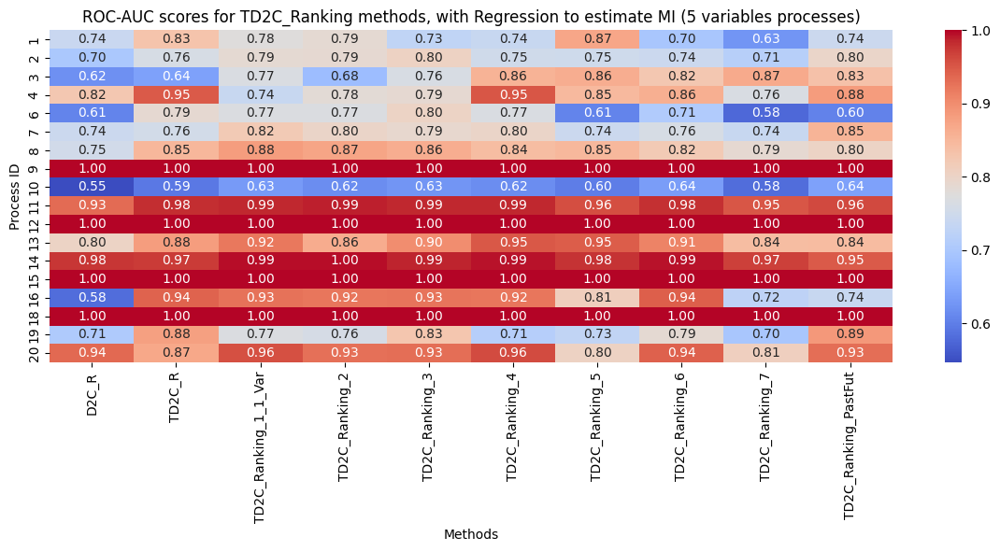

In [ ]:
import seaborn as sns

# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('ROC-AUC scores for TD2C_Ranking methods, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/plots/heatmap_TD2C_Ranking.pdf')

plt.show()

In [ ]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'roc_auc'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,roc_auc
0,1,0.753890
1,2,0.759589
2,3,0.771369
3,4,0.838923
4,6,0.699408
5,7,0.780770
6,8,0.832516
7,9,1.000000
8,10,0.608509
9,11,0.971141


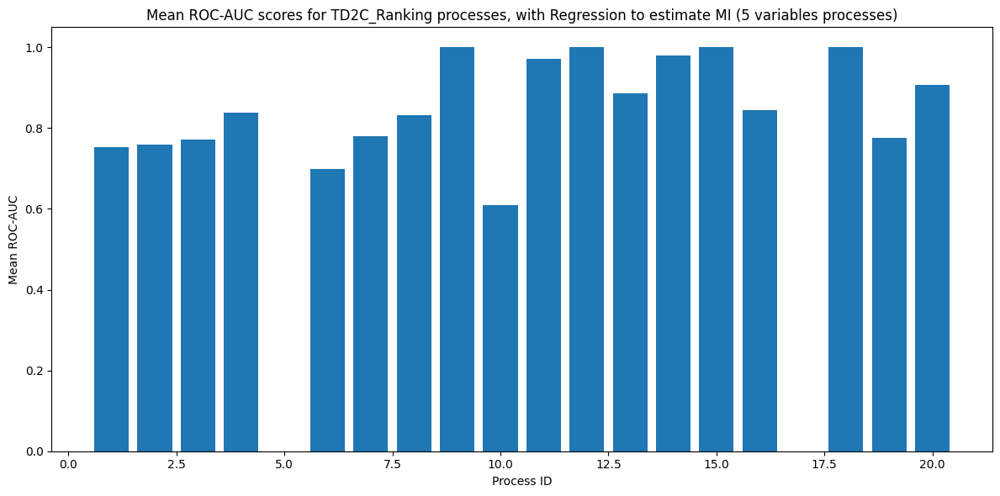

In [ ]:
# plot the dataframe as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['roc_auc'])
plt.title('Mean ROC-AUC scores for TD2C_Ranking processes, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Process ID')
plt.ylabel('Mean ROC-AUC')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/plots/barplot_TD2C_Ranking_mean_proc.pdf')

plt.show()

In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking.csv')

# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'roc_auc'})

df = df.sort_values(by='roc_auc', ascending=False)

df = df.reset_index(drop=True)

# drop Process ID 0 row
df = df.drop(0)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking_avg.csv', index=False)

df

,method,roc_auc
1,TD2C_Ranking_4,0.880354
2,TD2C_Ranking_1_1_Var,0.873577
3,TD2C_Ranking_3,0.873380
4,TD2C_R,0.871846
5,TD2C_Ranking_6,0.867173
6,TD2C_Ranking_2,0.864079
7,TD2C_Ranking_PastFut,0.859403
8,TD2C_Ranking_5,0.853142
9,TD2C_Ranking_7,0.813777
10,D2C_R,0.803717


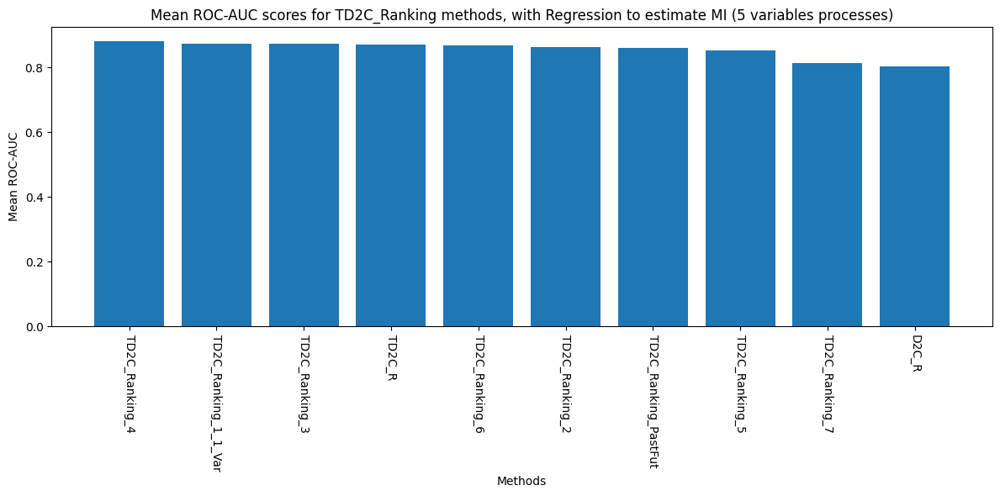

In [ ]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/metrics/roc_auc_td2c_ranking_avg.csv')

# Plotting Barplot for methods for indexes 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df['method'], df['roc_auc'])
plt.xticks(rotation=-90)
plt.title('Mean ROC-AUC scores for TD2C_Ranking methods, with KnnCMI to estimate MI (5 variables processes)')
plt.xlabel('Methods')
plt.ylabel('Mean ROC-AUC')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/KnnCMI/plots/barplot_TD2C_Ranking_avg.pdf')

plt.show()

### Precision

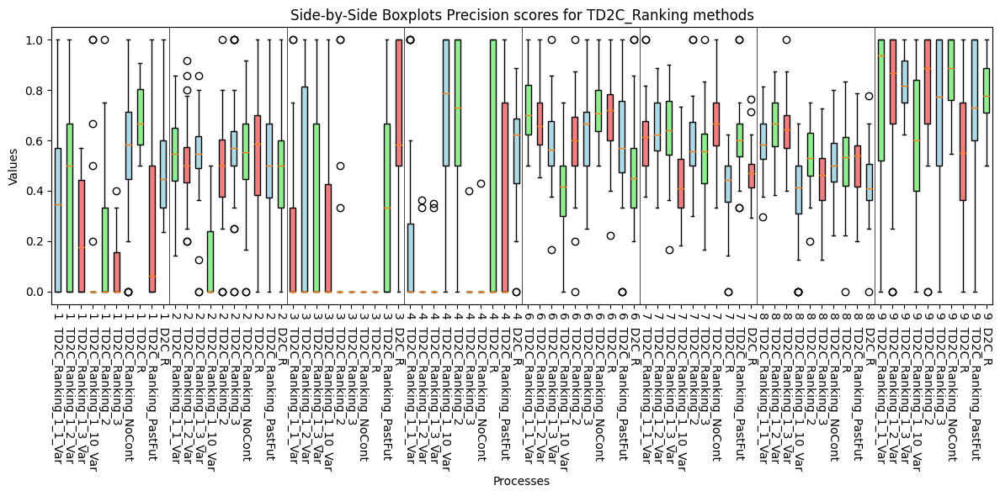

In [ ]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_precision_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_precision_process)
df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_precision_process)
df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_precision_process)
df5 = pd.DataFrame(TD2C_Ranking_2_precision_process)
df6 = pd.DataFrame(TD2C_Ranking_3_precision_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_precision_process)
df8 = pd.DataFrame(TD2C_precision_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_precision_process)
df10 = pd.DataFrame(D2C_precision_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    combined_data.append(df3[col])
    combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots Precision scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(10, len(labels), 10):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/boxplot_TD2C_Ranking_precision.pdf')

plt.show()

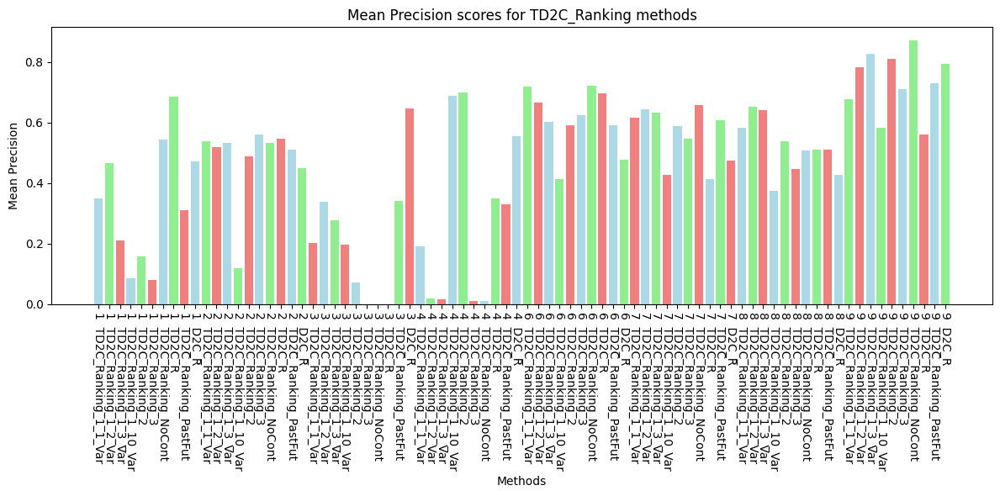

In [ ]:
# Plotting Barplot
mean_values = []
for data in combined_data:
    mean_values.append(np.mean(data))

plt.figure(figsize=(12, 6))

plt.bar(labels, mean_values, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Precision scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Precision')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_precision.pdf')

plt.show()

In [ ]:
# NOW SHOW THE PRECISION RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_precision_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_precision_process)
df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_precision_process)
df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_precision_process)
df5 = pd.DataFrame(TD2C_Ranking_2_precision_process)
df6 = pd.DataFrame(TD2C_Ranking_3_precision_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_precision_process)
df8 = pd.DataFrame(TD2C_precision_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_precision_process)
df10 = pd.DataFrame(D2C_precision_process)

df1 = df1.T
df2 = df2.T
df3 = df3.T
df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
df3['method'] = 'TD2C_Ranking_1_3_Var'
df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'

df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10])

df = df.reset_index()
df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='precision')

df['precision'] = df['precision'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='precision')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_Ranking_1_1_Var_precision_process': 'TD2C_Ranking_1_1_Var_precision_process',
                        'TD2C_Ranking_1_2_Var_precision_process': 'TD2C_Ranking_1_2_Var_precision_process',
                        'TD2C_Ranking_1_3_Var_precision_process': 'TD2C_Ranking_1_3_Var_precision_process',
                        'TD2C_Ranking_1_10_Var_precision_process': 'TD2C_Ranking_1_10_Var_precision_process',
                        'TD2C_Ranking_2_precision_process': 'TD2C_Ranking_2_precision_process',
                        'TD2C_Ranking_3_precision_process': 'TD2C_Ranking_3_precision_process',
                        'TD2C_Ranking_NoCont_precision_process': 'TD2C_Ranking_NoCont_precision_process',
                        'TD2C_R_precision_process': 'TD2C_R_precision_process',
                        'TD2C_Ranking_PastFut_precision_process': 'TD2C_Ranking_PastFut_precision_process',
                        'D2C_R_precision_process': 'D2C_R_precision_process'})


# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_37005/2425469640.py:44: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_10_Var,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_1_3_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.471779,0.686992,0.084167,0.349766,0.466860,0.210134,0.157431,0.080754,0.544455,0.311875
1,2,0.449859,0.548084,0.120070,0.537127,0.520063,0.531612,0.487972,0.561545,0.533127,0.510853
2,3,0.646667,0.000000,0.196458,0.201667,0.337917,0.276786,0.070833,0.000000,0.000000,0.340655
3,4,0.554700,0.350625,0.688151,0.189980,0.017424,0.017083,0.700225,0.010000,0.010714,0.329663
4,6,0.477305,0.696567,0.412907,0.717775,0.665670,0.602064,0.590032,0.625435,0.720938,0.590827
5,7,0.474309,0.414308,0.427670,0.616098,0.642952,0.634189,0.587871,0.545468,0.657972,0.607842
6,8,0.426210,0.510667,0.373571,0.583592,0.653726,0.641169,0.537510,0.445405,0.508926,0.510006
7,9,0.793215,0.559913,0.584236,0.677827,0.782312,0.828712,0.811934,0.709598,0.871989,0.729121


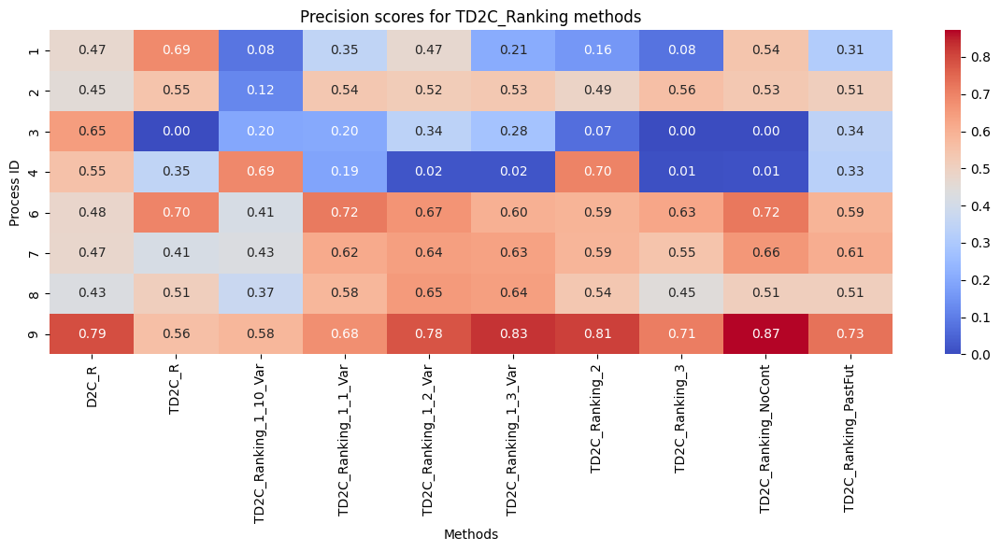

In [ ]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Precision scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/heatmap_TD2C_Ranking_precision.pdf')

plt.show()

In [ ]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'precision'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,precision
0,1,0.336421
1,2,0.480031
2,3,0.207098
3,4,0.286857
4,6,0.609952
5,7,0.560868
6,8,0.519078
7,9,0.734886


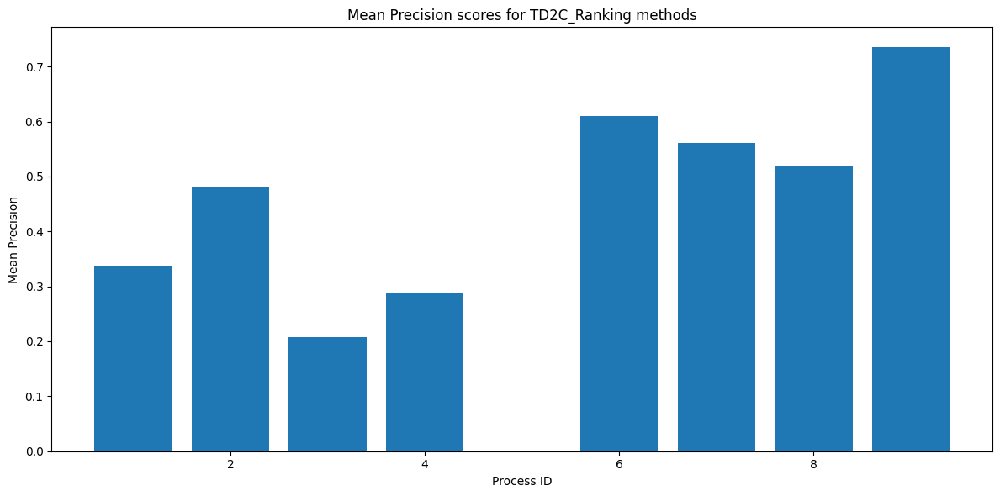

In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking_mean_proc.csv')

# plot the dataframe as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['precision'])
plt.title('Mean Precision scores for TD2C_Ranking methods')
plt.xlabel('Process ID')
plt.ylabel('Mean Precision')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_precision_mean_proc.pdf')

plt.show()


In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking.csv')

# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'precision'})

df = df.sort_values(by='precision', ascending=False)

df = df.reset_index(drop=True)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking_avg.csv', index=False)

df


,method,precision
0,Process ID,5.000000
1,D2C_R,0.536756
2,TD2C_Ranking_1_2_Var,0.510865
3,TD2C_Ranking_2,0.492976
4,TD2C_Ranking_PastFut,0.491355
5,TD2C_Ranking_1_1_Var,0.484229
6,TD2C_Ranking_NoCont,0.481015
7,TD2C_R,0.470894
8,TD2C_Ranking_1_3_Var,0.467719
9,TD2C_Ranking_3,0.372276


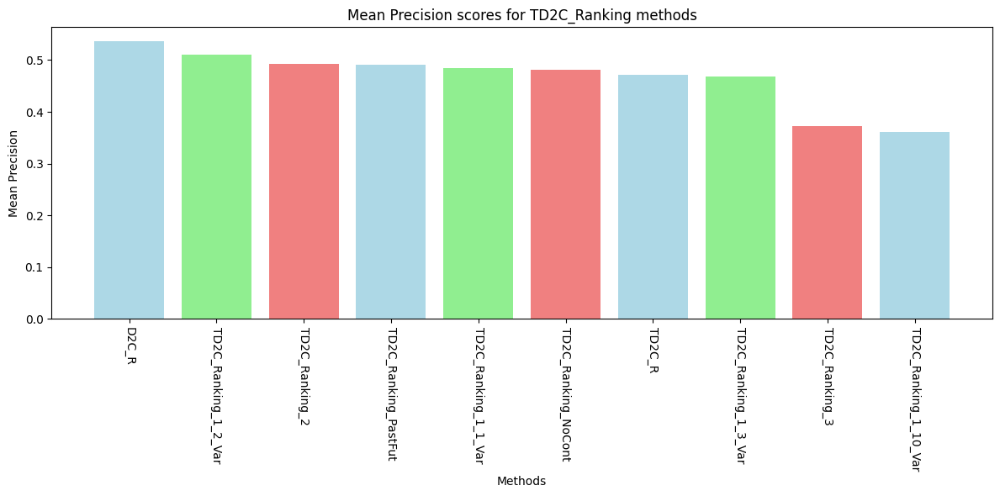

In [ ]:
# load the data from csv files
df_prec = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/precision_td2c_ranking_avg.csv')

# Barplot for precision scores from index 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df_prec['method'][1:], df_prec['precision'][1:], color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Precision scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Precision')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_precision_avg.pdf')

plt.show()

### Recall

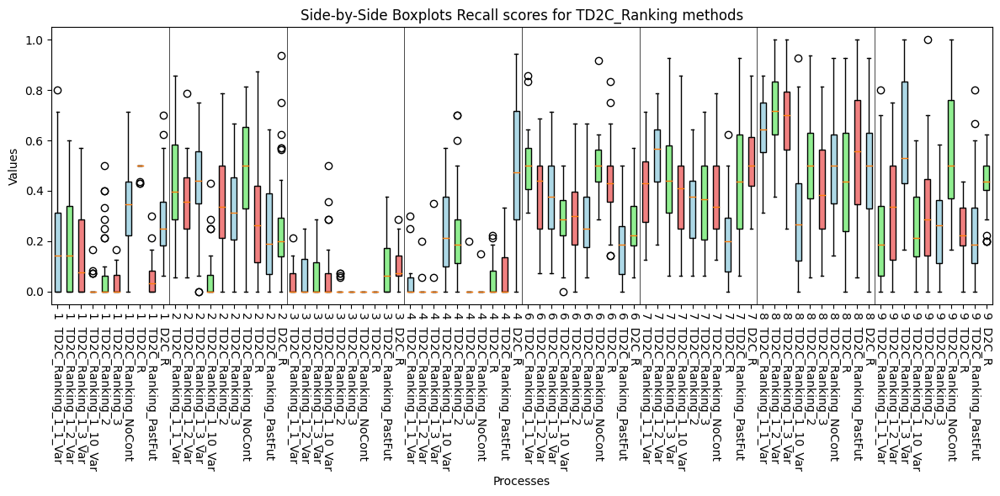

In [ ]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_recall_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_recall_process)
df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_recall_process)
df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_recall_process)
df5 = pd.DataFrame(TD2C_Ranking_2_recall_process)
df6 = pd.DataFrame(TD2C_Ranking_3_recall_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_recall_process)
df8 = pd.DataFrame(TD2C_Ranking_recall_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_recall_process)
df10 = pd.DataFrame(D2C_R_recall_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    combined_data.append(df3[col])
    combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])

# Create labels for x-axis
labels = []
for col in df1.columns:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']
for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])


plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots Recall scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(10, len(labels), 10):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/boxplot_TD2C_Ranking_recall.pdf')

plt.show()

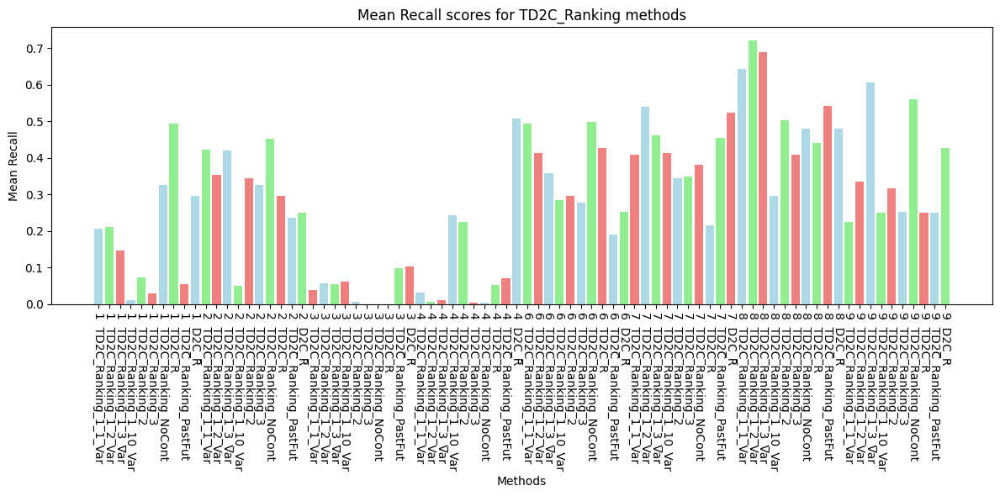

In [ ]:
# Plotting Barplot
mean_values = []
for data in combined_data:
    mean_values.append(np.mean(data))

plt.figure(figsize=(12, 6))
plt.bar(labels, mean_values, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Recall scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Recall')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_recall.pdf')

plt.show()

In [ ]:
# NOW SHOW THE RECALL RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_recall_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_recall_process)
df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_recall_process)
df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_recall_process)
df5 = pd.DataFrame(TD2C_Ranking_2_recall_process)
df6 = pd.DataFrame(TD2C_Ranking_3_recall_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_recall_process)
df8 = pd.DataFrame(TD2C_Ranking_recall_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_recall_process)
df10 = pd.DataFrame(D2C_R_recall_process)

df1 = df1.T
df2 = df2.T
df3 = df3.T
df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
df3['method'] = 'TD2C_Ranking_1_3_Var'
df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'


df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10])

df = df.reset_index()

df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='recall')

df['recall'] = df['recall'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='recall')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_Ranking_1_1_Var_recall_process': 'TD2C_Ranking_1_1_Var_recall_process',
                        'TD2C_Ranking_1_2_Var_recall_process': 'TD2C_Ranking_1_2_Var_recall_process',
                        'TD2C_Ranking_1_3_Var_recall_process': 'TD2C_Ranking_1_3_Var_recall_process',
                        'TD2C_Ranking_1_10_Var_recall_process': 'TD2C_Ranking_1_10_Var_recall_process',
                        'TD2C_Ranking_2_recall_process': 'TD2C_Ranking_2_recall_process',
                        'TD2C_Ranking_3_recall_process': 'TD2C_Ranking_3_recall_process',
                        'TD2C_Ranking_NoCont_recall_process': 'TD2C_Ranking_NoCont_recall_process',
                        'TD2C_R_recall_process': 'TD2C_R_recall_process',
                        'TD2C_Ranking_PastFut_recall_process': 'TD2C_Ranking_PastFut_recall_process',
                        'D2C_R_recall_process': 'D2C_R_recall_process'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_37005/591526913.py:46: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_10_Var,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_1_3_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.296136,0.494866,0.011607,0.205610,0.211488,0.147312,0.073690,0.028586,0.326265,0.055313
1,2,0.249876,0.295139,0.050744,0.421875,0.352480,0.419345,0.343378,0.326587,0.451463,0.235838
2,3,0.102207,0.000000,0.060491,0.038294,0.057862,0.055580,0.006523,0.000000,0.000000,0.097569
3,4,0.507138,0.051389,0.242480,0.032525,0.006389,0.010139,0.225561,0.005000,0.003750,0.070561
4,6,0.252455,0.426116,0.283433,0.493502,0.413889,0.357961,0.295139,0.277927,0.498859,0.190179
5,7,0.523338,0.216592,0.414162,0.408061,0.539385,0.461012,0.345238,0.349157,0.380903,0.455828
6,8,0.480729,0.441195,0.296999,0.643056,0.721404,0.690055,0.502604,0.409301,0.480952,0.541146
7,9,0.427946,0.250764,0.251017,0.224360,0.335372,0.606057,0.317312,0.253313,0.560263,0.249836


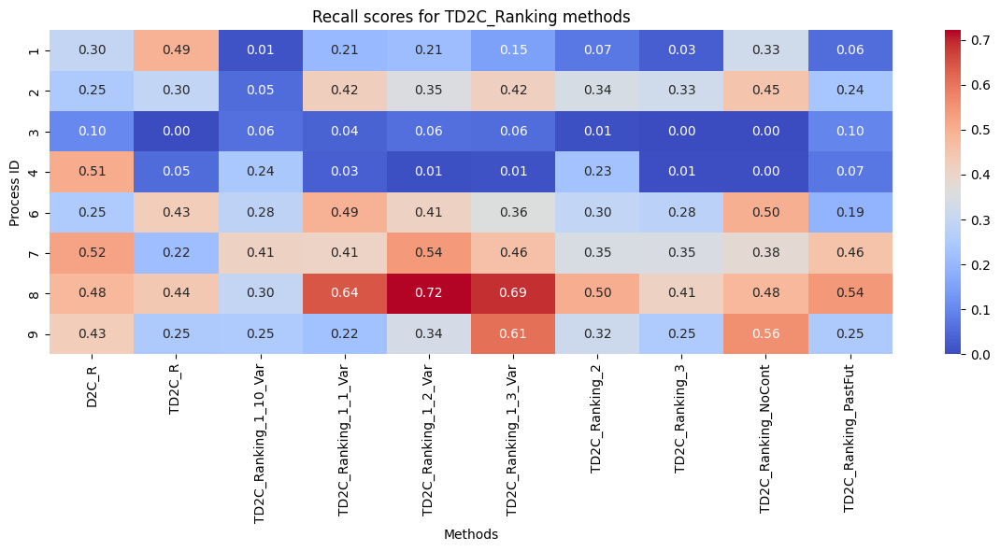

In [ ]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Recall scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/heatmap_TD2C_Ranking_recall.pdf')

plt.show()

In [ ]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'recall'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,recall
0,1,0.185087
1,2,0.314673
2,3,0.041853
3,4,0.115493
4,6,0.348946
5,7,0.409368
6,8,0.520744
7,9,0.347624


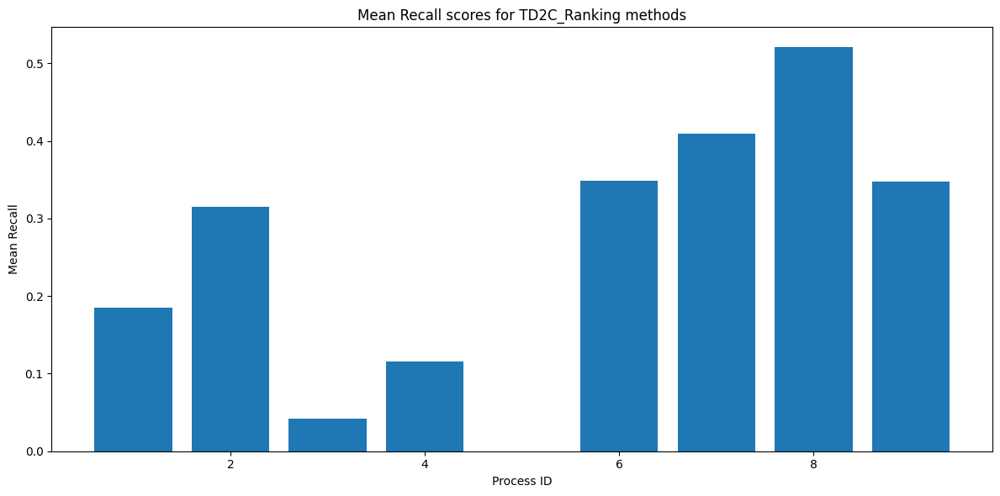

In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking_mean_proc.csv')


# plot the dataframe as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['recall'])
plt.title('Mean Recall scores for TD2C_Ranking methods')
plt.xlabel('Process ID')
plt.ylabel('Mean Recall')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_recall_mean_proc.pdf')

plt.show()

In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking.csv')


# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'recall'})

df = df.sort_values(by='recall', ascending=False)

df = df.reset_index(drop=True)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking_avg.csv', index=False)

df

,method,recall
0,Process ID,5.000000
1,D2C_R,0.354978
2,TD2C_Ranking_1_3_Var,0.343433
3,TD2C_Ranking_NoCont,0.337807
4,TD2C_Ranking_1_2_Var,0.329784
5,TD2C_Ranking_1_1_Var,0.308410
6,TD2C_R,0.272008
7,TD2C_Ranking_2,0.263681
8,TD2C_Ranking_PastFut,0.237034
9,TD2C_Ranking_3,0.206234


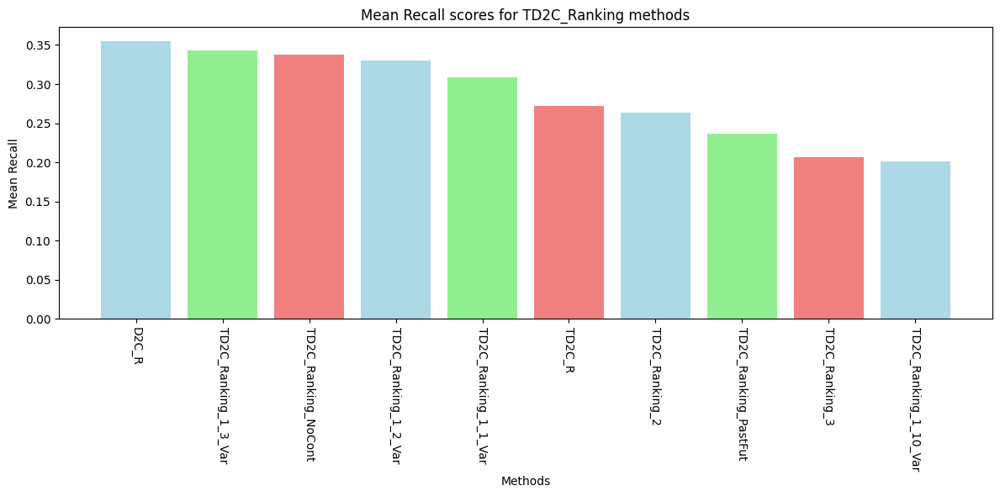

In [ ]:
# load the data from csv files
df_recall = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/recall_td2c_ranking_avg.csv')

# Barplot for recall scores from index 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df_recall['method'][1:], df_recall['recall'][1:], color=colors)
plt.xticks(rotation=-90)
plt.title('Mean Recall scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean Recall')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_recall_avg.pdf')

plt.show()

### F1

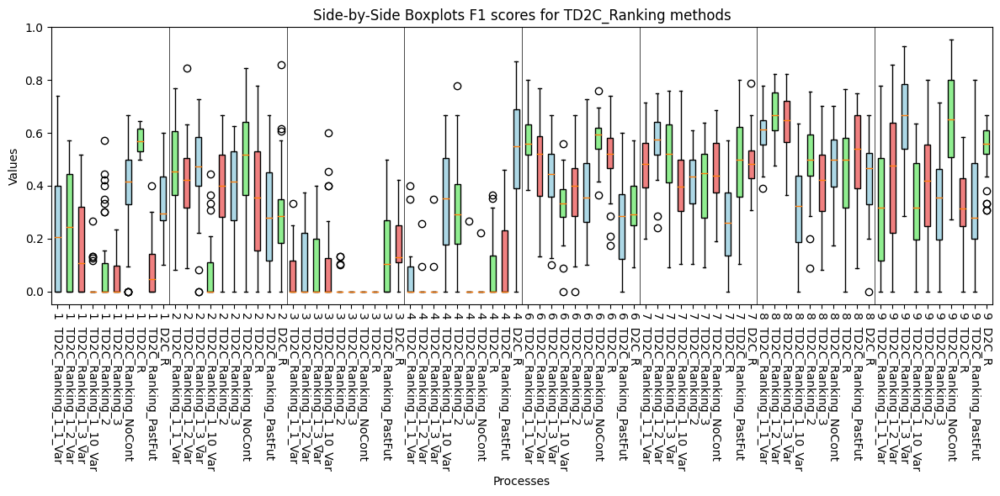

In [ ]:
# COMMENT OUT THE ONES YOU DIDN'T RUN
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_f1_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_f1_process)
df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_f1_process)
df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_f1_process)
df5 = pd.DataFrame(TD2C_Ranking_2_f1_process)
df6 = pd.DataFrame(TD2C_Ranking_3_f1_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_f1_process)
df8 = pd.DataFrame(TD2C_Ranking_f1_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_f1_process)
df10 = pd.DataFrame(D2C_R_f1_process)

# Combine data for boxplot
combined_data = []

for col in df1.columns:
    combined_data.append(df1[col])
    combined_data.append(df2[col])
    combined_data.append(df3[col])
    combined_data.append(df4[col])
    combined_data.append(df5[col])
    combined_data.append(df6[col])
    combined_data.append(df7[col])
    combined_data.append(df8[col])
    combined_data.append(df9[col])
    combined_data.append(df10[col])

# Create labels for x-axis
labels = []

for col in df1.columns:
    labels.append(f'{col}  TD2C_Ranking_1_1_Var')
    labels.append(f'{col}  TD2C_Ranking_1_2_Var')
    labels.append(f'{col}  TD2C_Ranking_1_3_Var')
    labels.append(f'{col}  TD2C_Ranking_1_10_Var')
    labels.append(f'{col}  TD2C_Ranking_2')
    labels.append(f'{col}  TD2C_Ranking_3')
    labels.append(f'{col}  TD2C_Ranking_NoCont')
    labels.append(f'{col}  TD2C_R')
    labels.append(f'{col}  TD2C_Ranking_PastFut')
    labels.append(f'{col}  D2C_R')

# Plotting
plt.figure(figsize=(12, 6))
box = plt.boxplot(combined_data, patch_artist=True)

# Color customization
colors = ['lightblue', 'lightgreen', 'lightcoral'] #, 'lightyellow']

for patch, i in zip(box['boxes'], range(len(box['boxes']))):
    patch.set_facecolor(colors[i % 3])

plt.xticks(range(1, len(labels) + 1), labels, rotation=-90)
plt.title('Side-by-Side Boxplots F1 scores for TD2C_Ranking methods')
plt.xlabel('Processes')
plt.ylabel('Values')
plt.tight_layout()

# add a vertical line every 6 boxes
for i in range(10, len(labels), 10):
    plt.axvline(x=i+0.5, color='black', linewidth=0.5)

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/boxplot_TD2C_Ranking_f1.pdf')

plt.show()


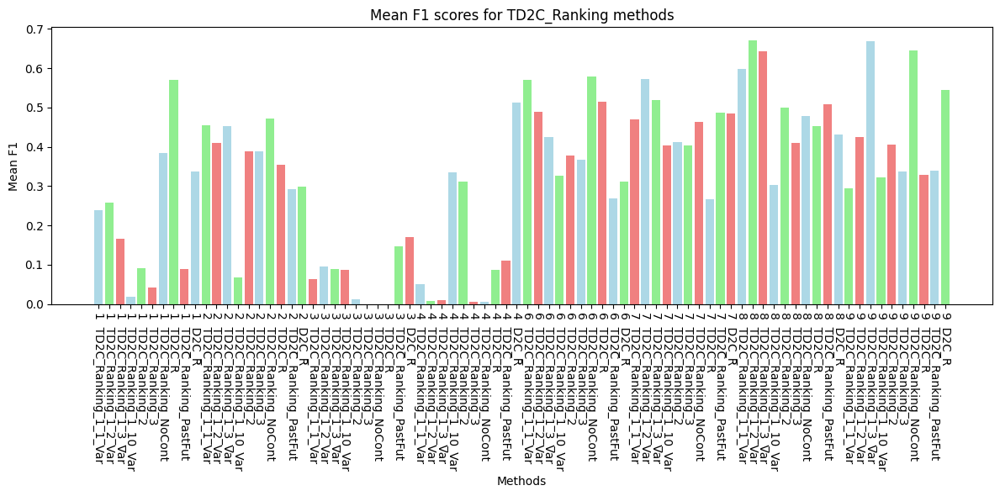

In [ ]:
# Plotting Barplot
mean_values = []
for data in combined_data:
    mean_values.append(np.mean(data))

plt.figure(figsize=(12, 6))
plt.bar(labels, mean_values, color=colors)
plt.xticks(rotation=-90)
plt.title('Mean F1 scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean F1')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_f1.pdf')

plt.show()

In [ ]:
# NOW SHOW THE F1 RESULTS IN A DATAFRAME DOING THE AVERAGES FOR EACH PROCESS FOR EACH METHOD
df1 = pd.DataFrame(TD2C_Ranking_1_1_Var_f1_process)
df2 = pd.DataFrame(TD2C_Ranking_1_2_Var_f1_process)
df3 = pd.DataFrame(TD2C_Ranking_1_3_Var_f1_process)
df4 = pd.DataFrame(TD2C_Ranking_1_10_Var_f1_process)
df5 = pd.DataFrame(TD2C_Ranking_2_f1_process)
df6 = pd.DataFrame(TD2C_Ranking_3_f1_process)
df7 = pd.DataFrame(TD2C_Ranking_NoCont_f1_process)
df8 = pd.DataFrame(TD2C_Ranking_f1_process)
df9 = pd.DataFrame(TD2C_Ranking_PastFut_f1_process)
df10 = pd.DataFrame(D2C_R_f1_process)

df1 = df1.T
df2 = df2.T
df3 = df3.T
df4 = df4.T
df5 = df5.T
df6 = df6.T
df7 = df7.T
df8 = df8.T
df9 = df9.T
df10 = df10.T

df1['method'] = 'TD2C_Ranking_1_1_Var'
df2['method'] = 'TD2C_Ranking_1_2_Var'
df3['method'] = 'TD2C_Ranking_1_3_Var'
df4['method'] = 'TD2C_Ranking_1_10_Var'
df5['method'] = 'TD2C_Ranking_2'
df6['method'] = 'TD2C_Ranking_3'
df7['method'] = 'TD2C_Ranking_NoCont'
df8['method'] = 'TD2C_R'
df9['method'] = 'TD2C_Ranking_PastFut'
df10['method'] = 'D2C_R'

df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10])

df = df.reset_index()
df = df.rename(columns={'index': 'process_id'})

df = df.melt(id_vars=['process_id', 'method'], var_name='graph_id', value_name='f1')

df['f1'] = df['f1'].astype(float)

df = df.groupby(['process_id', 'method']).mean().reset_index()

df = df.pivot(index='process_id', columns='method', values='f1')

df = df.reset_index()

df = df.rename(columns={'process_id': 'Process ID',
                        'TD2C_Ranking_1_1_Var_f1_process': 'TD2C_Ranking_1_1_Var_f1_process',
                        'TD2C_Ranking_1_2_Var_f1_process': 'TD2C_Ranking_1_2_Var_f1_process',
                        'TD2C_Ranking_1_3_Var_f1_process': 'TD2C_Ranking_1_3_Var_f1_process',
                        'TD2C_Ranking_1_10_Var_f1_process': 'TD2C_Ranking_1_10_Var_f1_process',
                        'TD2C_Ranking_2_f1_process': 'TD2C_Ranking_2_f1_process',
                        'TD2C_Ranking_3_f1_process': 'TD2C_Ranking_3_f1_process',
                        'TD2C_Ranking_NoCont_f1_process': 'TD2C_Ranking_NoCont_f1_process',
                        'TD2C_R_f1_process': 'TD2C_R_f1_process',
                        'TD2C_Ranking_PastFut_f1_process': 'TD2C_Ranking_PastFut_f1_process',
                        'D2C_R_f1_process': 'D2C_R_f1_process'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking.csv', index=False)

df

/tmp/ipykernel_37005/1352930737.py:44: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(['process_id', 'method']).mean().reset_index()


method,Process ID,D2C_R,TD2C_R,TD2C_Ranking_1_10_Var,TD2C_Ranking_1_1_Var,TD2C_Ranking_1_2_Var,TD2C_Ranking_1_3_Var,TD2C_Ranking_2,TD2C_Ranking_3,TD2C_Ranking_NoCont,TD2C_Ranking_PastFut
0,1,0.337577,0.570932,0.019400,0.239623,0.257405,0.166167,0.092252,0.041124,0.384798,0.088362
1,2,0.297721,0.353797,0.066962,0.455612,0.409353,0.453694,0.388329,0.387857,0.471880,0.292850
2,3,0.170695,0.000000,0.086969,0.063514,0.096275,0.089830,0.011798,0.000000,0.000000,0.147395
3,4,0.513656,0.086748,0.335623,0.050633,0.008833,0.011131,0.311380,0.006667,0.005556,0.109670
4,6,0.312641,0.514442,0.326218,0.571218,0.489654,0.424884,0.378811,0.367014,0.579747,0.269516
5,7,0.485115,0.267570,0.402918,0.470536,0.571569,0.518537,0.411245,0.404092,0.463395,0.486521
6,8,0.431065,0.453755,0.302471,0.598087,0.670822,0.643279,0.499355,0.409189,0.478409,0.507853
7,9,0.544894,0.328336,0.321462,0.295490,0.424840,0.667685,0.406126,0.337959,0.646057,0.338972


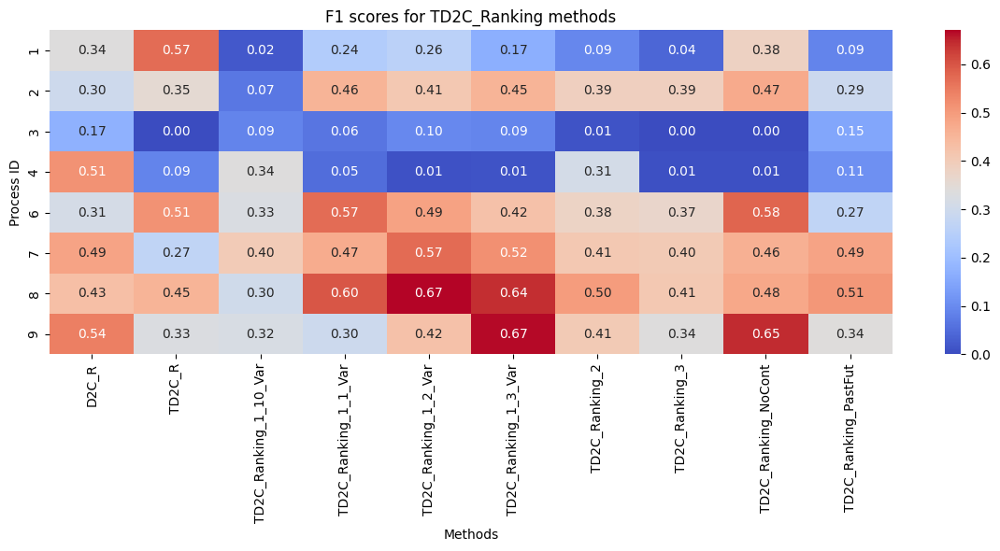

In [ ]:
# load the dataframe from the csv file
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking.csv')

# Plot the dataframe as a heatmap
df = df.set_index('Process ID')

plt.figure(figsize=(12, 6))
sns.heatmap(df, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('F1 scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Process ID')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/heatmap_TD2C_Ranking_f1.pdf')

plt.show()

In [ ]:
# now average each row of the dataframe
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking.csv')

df = df.set_index('Process ID')

df = df.mean(axis=1)

df = df.reset_index()

df = df.rename(columns={0: 'f1'})

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking_mean_proc.csv', index=False)

df

,Process ID,f1
0,1,0.219764
1,2,0.357806
2,3,0.066648
3,4,0.143990
4,6,0.423414
5,7,0.448150
6,8,0.499428
7,9,0.431182


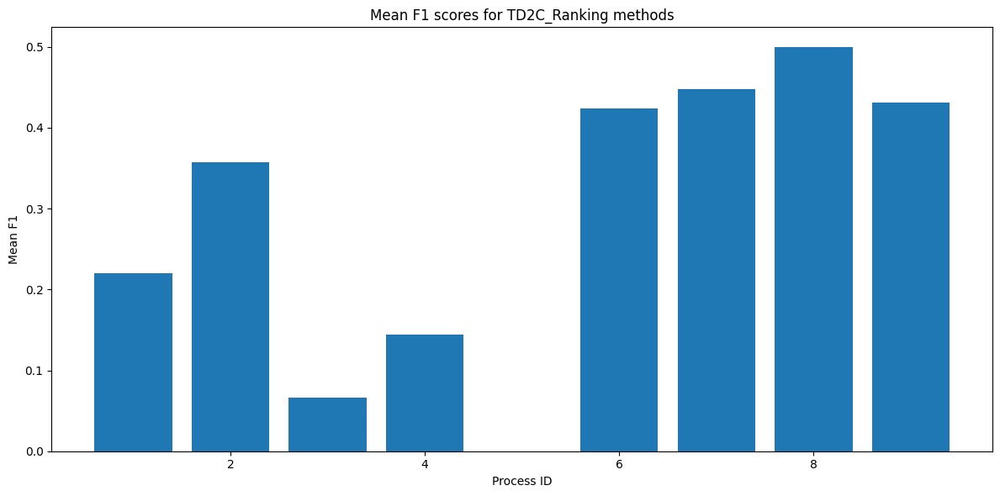

In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking_mean_proc.csv')

# plot the dataframe as a barplot
plt.figure(figsize=(12, 6))
plt.bar(df['Process ID'], df['f1'])
plt.title('Mean F1 scores for TD2C_Ranking methods')
plt.xlabel('Process ID')
plt.ylabel('Mean F1')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_f1_mean_proc.pdf')

plt.show()

In [ ]:
df = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking.csv')


# now average the results for each process
df = df.mean()

df = df.reset_index()

df = df.rename(columns={'index': 'method', 0: 'f1'})

df = df.sort_values(by='f1', ascending=False)

df = df.reset_index(drop=True)

# save the dataframe to a csv file to folder
df.to_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking_avg.csv', index=False)

df

,method,f1
0,Process ID,5.000000
1,D2C_R,0.386671
2,TD2C_Ranking_NoCont,0.378730
3,TD2C_Ranking_1_3_Var,0.371901
4,TD2C_Ranking_1_2_Var,0.366094
5,TD2C_Ranking_1_1_Var,0.343089
6,TD2C_R,0.321947
7,TD2C_Ranking_2,0.312412
8,TD2C_Ranking_PastFut,0.280142
9,TD2C_Ranking_3,0.244237


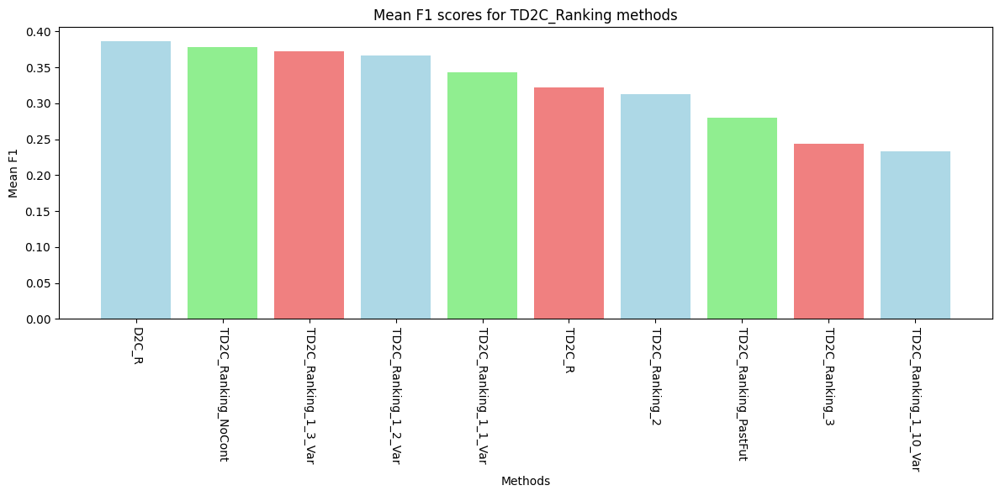

In [ ]:
# load the data from csv files
df_f1 = pd.read_csv('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/metrics/f1_td2c_ranking_avg.csv')

# Barplot for f1 scores from index 1 to 6
plt.figure(figsize=(12, 6))
plt.bar(df_f1['method'][1:], df_f1['f1'][1:], color=colors)
plt.xticks(rotation=-90)
plt.title('Mean F1 scores for TD2C_Ranking methods')
plt.xlabel('Methods')
plt.ylabel('Mean F1')
plt.tight_layout()

# save the plot as a pdf in folder
plt.savefig('/home/jpalombarini/td2c/notebooks/contributions/td2c_extesions/results/plots/barplot_TD2C_Ranking_f1_avg.pdf')

plt.show()